In [1176]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as  np
from scipy import signal
import scipy

In [1177]:
data_path = "..\\Datasets\\Forecasting_aqua\\ctd_meteo_aua_2019to2021_V2.csv"
format = "%d-%m-%Y"
df = pd.read_csv(data_path)
time_df = pd.to_datetime(df["Datetime"], format=format)
try:
    df.drop("sample",axis=1,inplace=True)
except:
    pass
df['Datetime']= time_df

In [1178]:
df

,Datetime,asplanchna,asterionella,brachionus,diatom_chain,dinobryon,eudiaptomus,kellikottia,keratella_quadrata,nauplius,...,cv_thermo,mean_schmidt,cv_schmidt,mean_epi_temp,cv_epi_temp,mean_mixed_layer_depth,cv_mixed_layer_depth,ml_irradiance,mean_oxycline_depth,cv_oxycline_depth
0,2019-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2019-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,2021-12-27,0.001250,0.000208,0.000556,0.000069,0.000347,0.005556,0.000417,0.000833,0.017569,...,0.0,0.370027,1.253755,5.827955,0.000440,3.075,0.276423,6.482638,14.4125,0.379879
1092,2021-12-28,0.000764,0.000069,0.000139,0.000069,0.000833,0.006458,0.001111,0.000833,0.016667,...,0.0,0.028860,3.153363,5.817873,0.002496,2.650,0.000000,5.009945,17.1500,0.000000
1093,2021-12-29,0.000694,0.000208,0.000139,0.000069,0.000486,0.005764,0.000833,0.000833,0.016389,...,0.0,0.300706,1.247375,5.813725,0.004129,4.875,0.671279,NaN,17.1500,0.000000
1094,2021-12-30,0.001111,0.000347,0.000278,0.000000,0.000347,0.005208,0.000764,0.000694,0.019444,...,0.0,1.447501,0.740899,5.882854,0.009166,2.775,0.068215,8.024163,17.1500,0.000000


In [1179]:
msg = "the different keys are:\n"
for key in df.keys():
    msg+= "-"+key+"\n"
print(msg)

the different keys are:
-Datetime
-asplanchna
-asterionella
-brachionus
-diatom_chain
-dinobryon
-eudiaptomus
-kellikottia
-keratella_quadrata
-nauplius
-polyarthra
-rotifers
-synchaeta
-ceratium
-cyclops
-fragilaria
-keratella_cochlearis
-paradileptus
-bosmina
-daphnia
-trichocerca
-conochilus
-diaphanosoma
-uroglena
-leptodora
-chaoborus
-aphanizomenon
-cluster_1
-cluster_2
-cluster_3
-cluster_4
-cluster_5
-cluster_6
-cluster_7
-cluster_8
-diatom
-ciliate
-mean_temp
-cv_temp_day
-cv_temp_depth
-mean_condF
-cv_condF_day
-cv_condF_depth
-mean_o2
-cv_o2_day
-cv_o2_depth
-mean_o2ppm
-cv_o2ppm_day
-cv_o2ppm_depth
-mean_ph
-cv_ph_day
-cv_ph_depth
-mean_chla
-cv_chla_day
-cv_chla_depth
-mean_turb
-cv_turb_day
-cv_turb_depth
-mean_phycoer
-cv_phycoer_day
-cv_phycoer_depth
-mean_par
-cv_par_day
-cv_par_depth
-mean_phy
-cv_phy_day
-cv_phy_depth
-mean_cloud_cover
-mean_global_radiation
-atmospheric_pressure_max
-atmospheric_pressure_min
-atmospheric_pressure_mean
-temp_max
-temp_min
-temp_mean


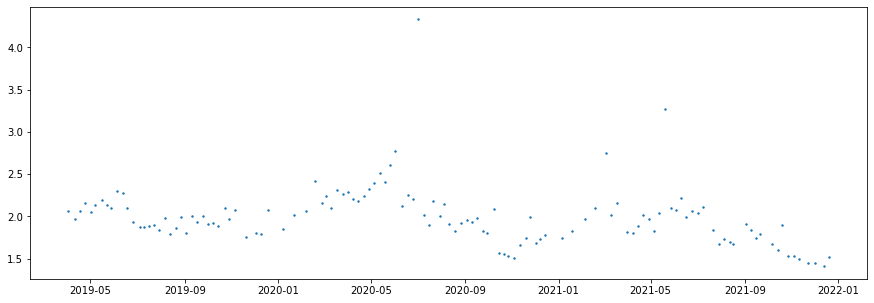

In [1180]:
key = 'TN'
fig,ax = plt.subplots(1,figsize=(15,5))
ax.scatter(df['Datetime'],df[key],s=2)

As the data is cut into yearly patches, it might be more meaningful to compare it year to year

In [1181]:
df['year'] = df['Datetime'].dt.year
df['month'] = df['Datetime'].dt.month
df['day'] = df['Datetime'].dt.day

Text(0.5, 0, 'day')

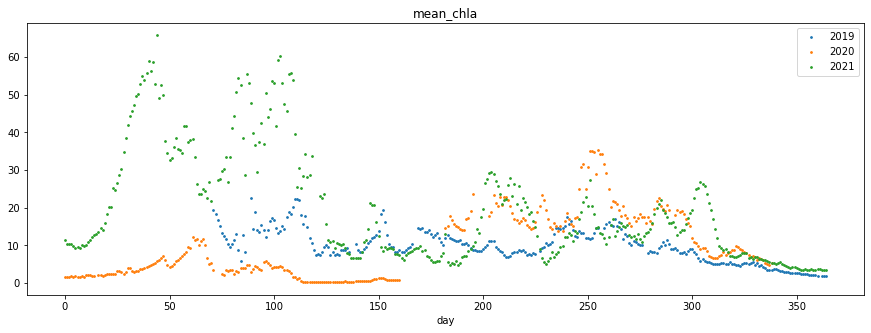

In [1182]:
key = 'mean_chla'
fig,ax = plt.subplots(1,figsize=(15,5))

years = df['year'].unique()
for year in years:
    dfy = df[df['year']==year]
    yeardt = np.datetime64(str(year),'Y')
    n_days = (dfy['Datetime']-yeardt).dt.days
    ax.scatter(n_days,dfy[key],s=3)
ax.legend([str(year) for year in years])
ax.set_title(key)
ax.set_xlabel("day")

The previous plot is computed for all variables and saved as pdf

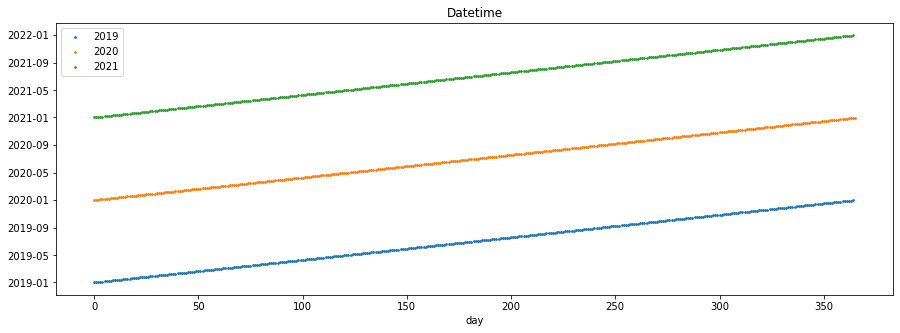

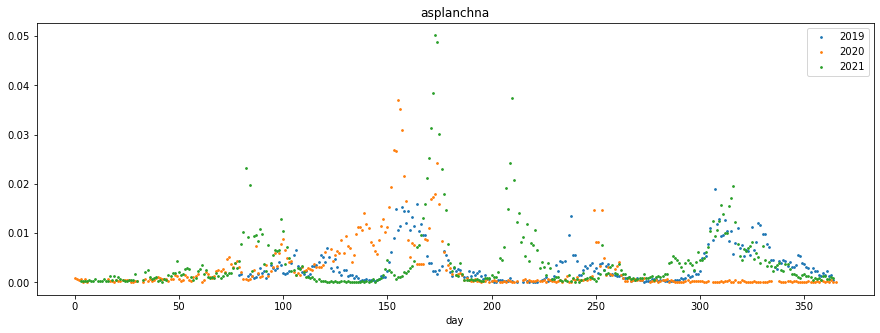

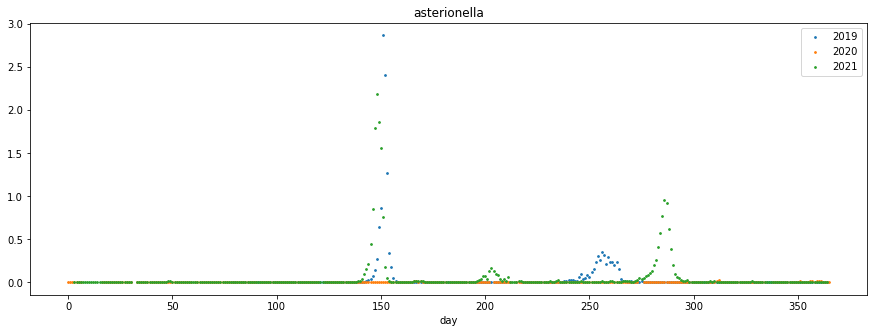

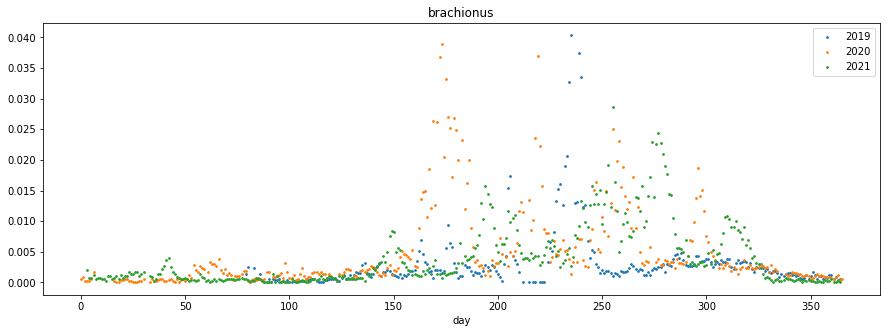

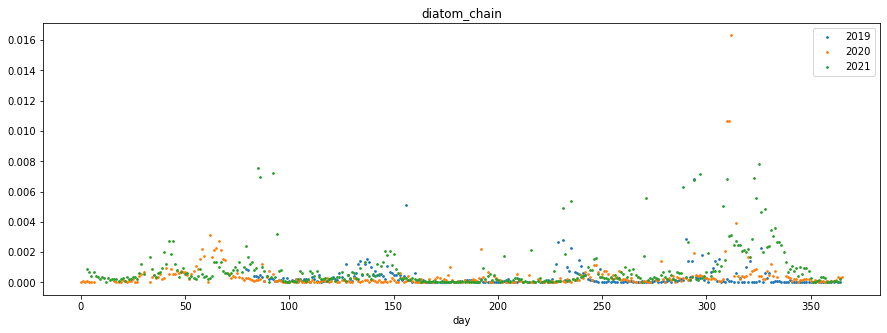

...

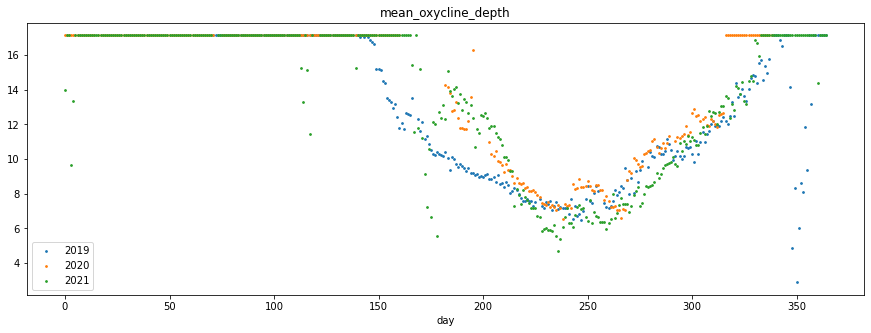

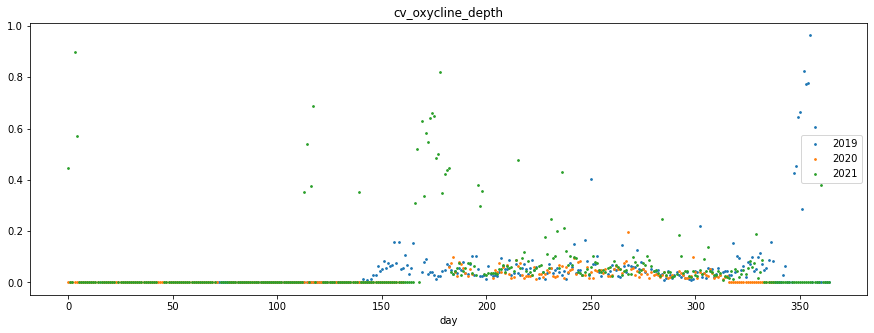

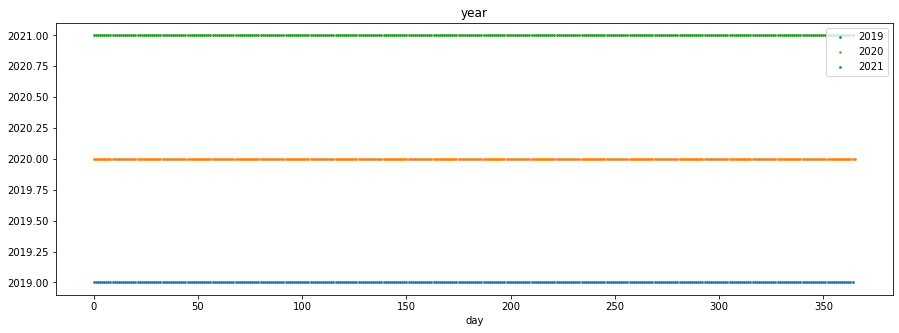

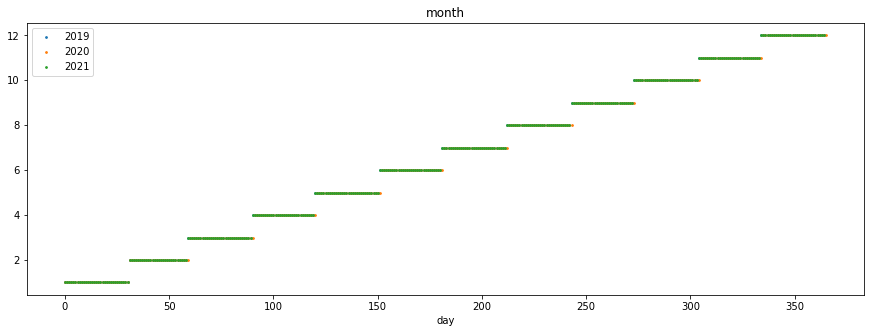

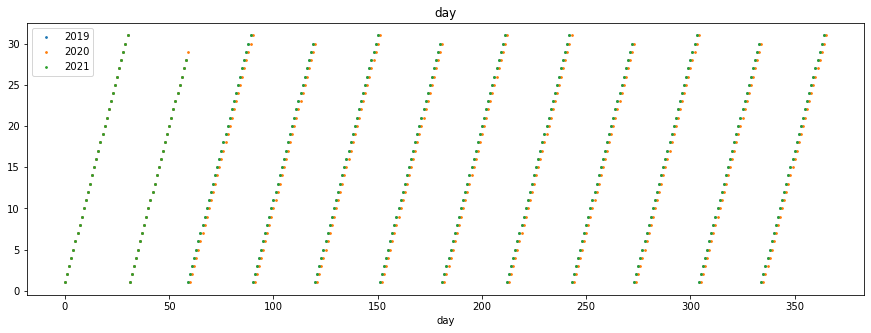

In [1183]:
from matplotlib.backends.backend_pdf import PdfPages
pp = PdfPages('variables.pdf')

years = df['year'].unique()
for key in df.keys():
    fig,ax = plt.subplots(1,figsize=(15,5))
    for year in years:
        dfy = df[(df['year']==year)]
        yeardt = np.datetime64(str(year),'Y')
        n_days = (dfy['Datetime']-yeardt).dt.days
        ax.scatter(n_days,dfy[key],s=3)
    ax.legend([str(year) for year in years])
    ax.set_title(key)
    ax.set_xlabel("day")
    pp.savefig()
pp.close()

Now that the data can be visualized, let's check some characteristics: first the data will be treated year by year, and then the variance between years will be checked

### Mean and variance
To make this comparaison meaningful, each variable is normalized

In [1184]:
dfn = df-df.min()
dfn = dfn/dfn.max()

In [1185]:
dfn.mean()[key]

0.4910888077858881

In [1186]:
msg = "{:20}".format("key")+"{:8s}".format("mean")+"{:8s}".format("var")+"{:8s}".format("median")+"\n"
for key in dfn.keys():
    msg+=("{:18s}".format(key)+"{:8.4f}".format(dfn.mean()[key])+"{:8.4f}".format(dfn.var()[key])+
         "{:8.4f}".format(dfn.median()[key])+"\n")
print(msg)

key                 mean    var     median  
Datetime            0.5000  0.0836  0.5000
asplanchna          0.0707  0.0118  0.0305
asterionella        0.0118  0.0045  0.0004
brachionus          0.1009  0.0202  0.0492
diatom_chain        0.0347  0.0055  0.0128
dinobryon           0.0378  0.0108  0.0013
eudiaptomus         0.1881  0.0170  0.1503
kellikottia         0.0991  0.0078  0.0729
keratella_quadrata  0.1117  0.0182  0.0553
nauplius            0.1469  0.0128  0.1149
polyarthra          0.0229  0.0046  0.0048
rotifers            0.1195  0.0149  0.0804
synchaeta           0.0667  0.0137  0.0196
ceratium            0.0675  0.0149  0.0166
cyclops             0.1730  0.0159  0.1423
fragilaria          0.0216  0.0075  0.0005
keratella_cochlearis  0.0455  0.0083  0.0219
paradileptus        0.0705  0.0184  0.0186
bosmina             0.0586  0.0101  0.0200
daphnia             0.1527  0.0212  0.1097
trichocerca         0.0315  0.0046  0.0126
conochilus          0.0559  0.0086  0.0213
diaphan

## Interpolation
To find the cross correlation of the time series, the time series are interpolated using splines of order 3:

[]

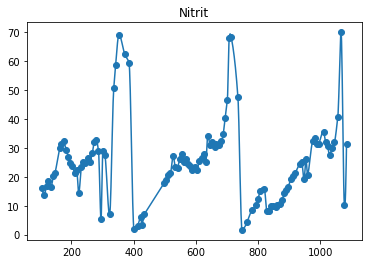

In [1187]:
key = 'Nitrit' #display an example
dfd = df.drop('Datetime',axis=1)
dfi = dfd.interpolate(method='akima', limit_direction='forward', axis=0)
plt.scatter(np.arange(len(df)),df[key])
plt.plot(np.arange(len(dfi)),dfi[key])
plt.title(key)
plt.plot()

### Autocorrelation:

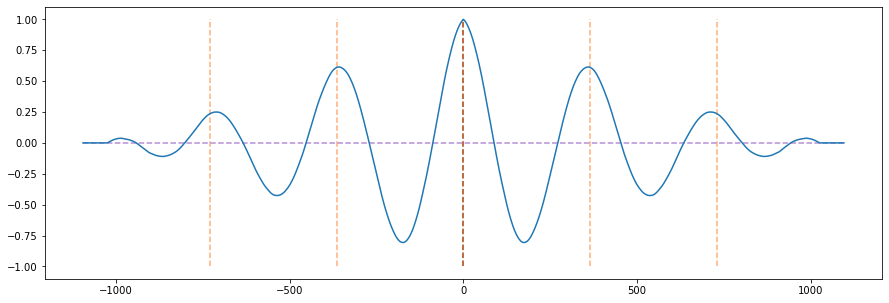

In [1188]:
key = 'mean_temp'
fig,ax = plt.subplots(1,figsize=(15,5))

dfci = dfi-dfi.mean()
dfci = dfci.fillna(0)
autocor = signal.correlate(dfci[key],dfci[key], mode='full').astype(float)
autocor /=np.max(autocor)#dfci[key].std()*dfci[key].std()*len(dfci[key])
lags = signal.correlation_lags(len(dfci[key]), len(dfci[key]), mode='full')
ax.plot(lags,autocor)
for k in range(-len(years)+1,len(years)):
    if k==0:
        ax.vlines(0, -1, 1,linestyles='dashed',color='xkcd:rust')
    else:
        ax.vlines(365*k, -1, 1,linestyles='dashed',color='xkcd:peach')
ax.hlines(0,lags[0],lags[-1],linestyles='dashed',color='xkcd:pale purple')

Due to the saisonnal pattern of several variables, using a time2vec embedding could improve the results in no periodic intrinsic bias are present in the model

### Yearly autocorrelation
In this plot, the autocorrelation is computed for each year, considering the signal as periodic, and thus appending to itself to replace the 0-padding

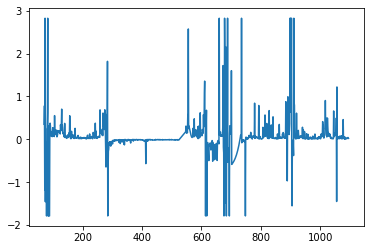

In [310]:
plt.plot(dfi.clip(lower=df.quantile(0.01),upper=df.quantile(0.99),axis=1)['cv_turb_day'])

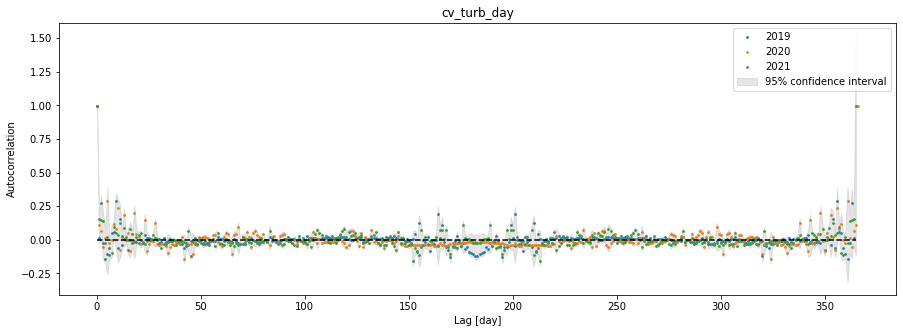

In [311]:
key = 'cv_turb_day'
fig,ax = plt.subplots(1,figsize=(15,5))

years = dfi['year'].unique()

df_y = dfi[dfi['year']==years[0]]
autocor_a = np.zeros((len(years),len(df_y)+1))

for idx,year in enumerate(years):
    df_y = dfi[dfi['year']==year]
    #saturate at the 99th percentile
    df_y = df_y.clip(lower=df.quantile(0.01),upper=df.quantile(0.99),axis=1)
    dfc_y = df_y-df_y.mean()
    dfc_y = dfc_y.fillna(0)
    autocor = signal.correlate(dfc_y[key],dfc_y[key].append(dfc_y[key]), mode='valid').astype(float)
    if dfc_y[key].var() == 0.0:
        autocor = np.zeros_like(autocor)
    else:
        autocor /= dfc_y[key].var()*len(dfc_y[key])
    autocor_a[idx,:] = autocor[:autocor_a.shape[1]]
    lags = signal.correlation_lags(2*len(dfc_y[key]), len(dfc_y[key]), mode='valid')
    
    ax.scatter(lags,autocor,s=3)
    
ax.set_xlabel("Lag [day]")
ax.set_ylabel("Autocorrelation")
mean = np.mean(autocor_a,axis=0)
std = np.std(autocor_a,axis=0)
ax.fill_between(lags, mean - 1.96*std, mean + 1.96*std,
                 color='gray', alpha=0.2)
ax.legend([2019,2020,2021,"95% confidence interval"])
ax.hlines(0,lags[0],lags[-1],linestyles='dashed',color='black')
ax.set_title(key)
plt.show()

The previous plot is calculated for all the keys, and is saved externally:

C:\Users\valla\AppData\Local\Temp\ipykernel_11092\3826436144.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(1,figsize=(15,5))


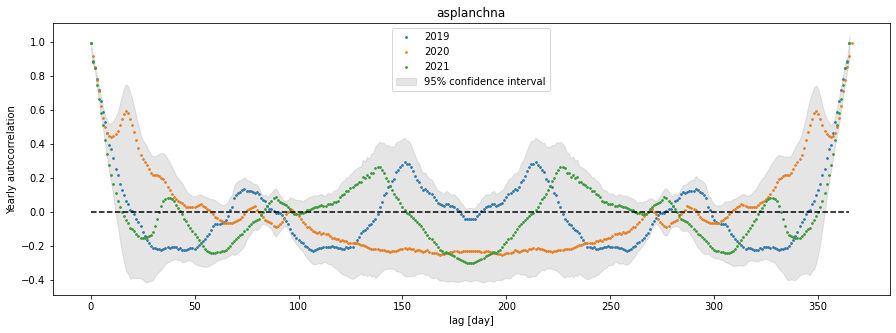

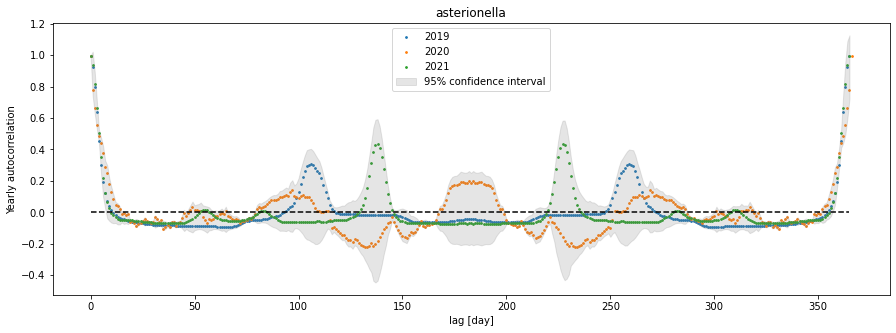

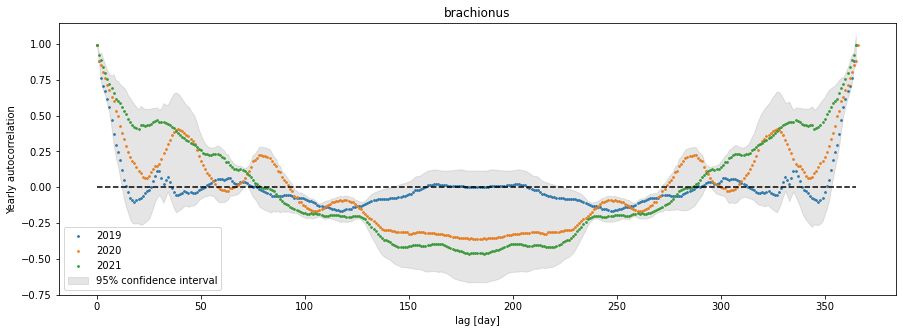

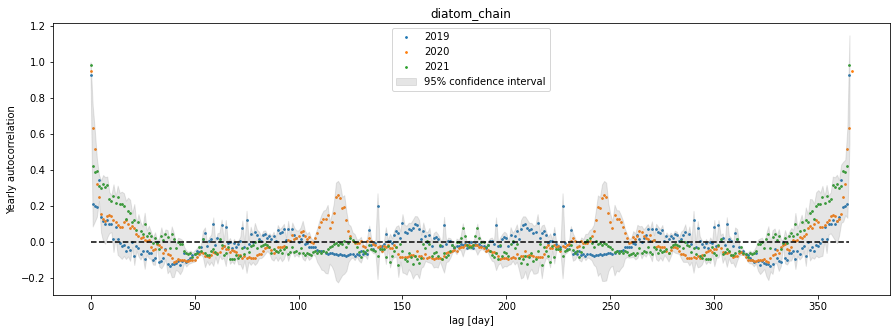

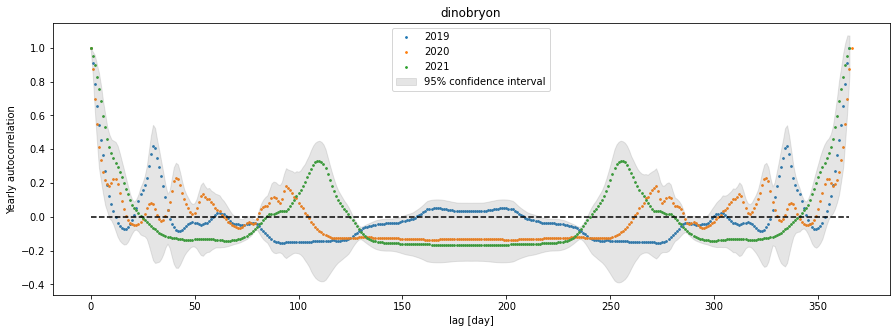

...

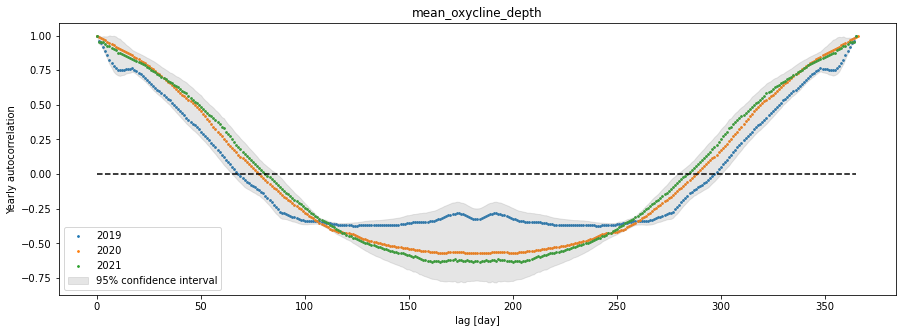

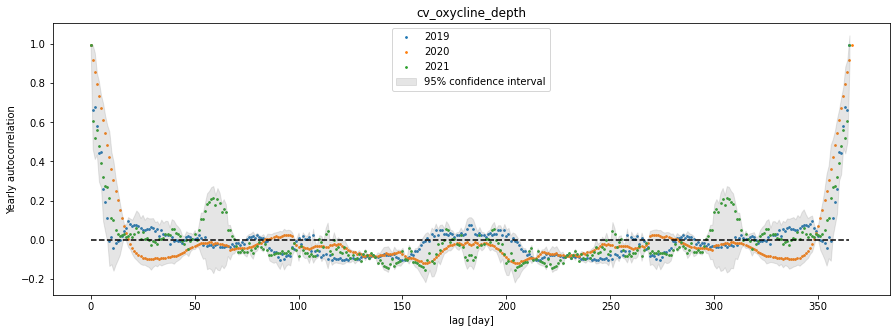

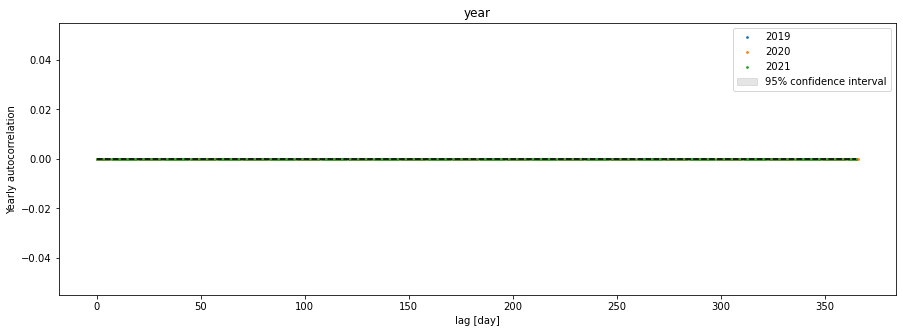

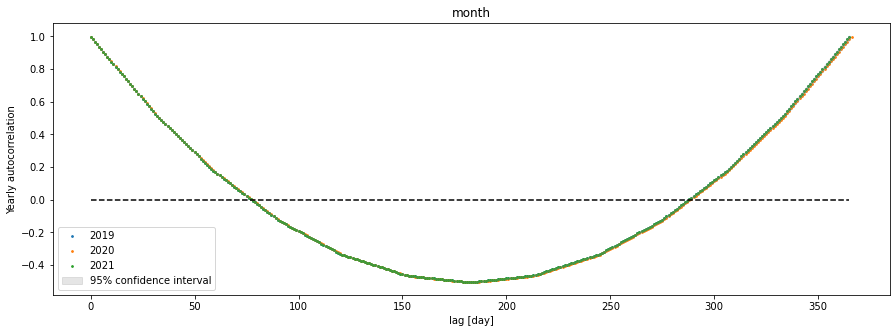

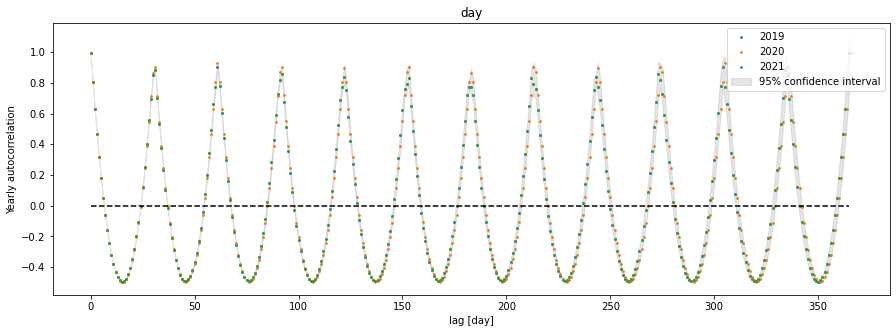

In [312]:
from matplotlib.backends.backend_pdf import PdfPages
pp = PdfPages('autocor.pdf')

years = dfi['year'].unique()
df_y = dfci[dfi['year']==years[0]]
autocor_a = np.zeros((len(years),len(df_y)+1))

for key in dfi.keys():
    fig,ax = plt.subplots(1,figsize=(15,5))


    for idx,year in enumerate(years):
        df_y = dfi[dfi['year']==year]
        #saturate at the 99th percentile
        df_y = df_y.clip(lower=df.quantile(0.01),upper=df.quantile(0.99),axis=1)
        dfc_y = df_y-df_y.mean()
        dfc_y = dfc_y.fillna(0)
        autocor = signal.correlate(dfc_y[key],dfc_y[key].append(dfc_y[key]), mode='valid').astype(float)
        autocor /= dfc_y[key].var()*len(dfc_y)+0.00001
        autocor_a[idx,:] = autocor[:autocor_a.shape[1]]
        lags = signal.correlation_lags(2*len(dfc_y[key]), len(dfc_y[key]), mode='valid')

        ax.scatter(lags,autocor,s=3)

    ax.set_xlabel("lag [day]")
    ax.set_ylabel("Yearly autocorrelation")
    mean = np.mean(autocor_a,axis=0)
    std = np.std(autocor_a,axis=0)
    ax.fill_between(lags, mean - 1.96*std, mean + 1.96*std,
                     color='gray', alpha=0.2)
    ax.legend([2019,2020,2021,"95% confidence interval"])
    ax.hlines(0,lags[0],lags[-1],linestyles='dashed',color='black')
    ax.set_title(key)
    pp.savefig()
pp.close()

### Cross Corr:
The cross correlation of the key with all the keys:

Text(0.5, 1.0, 'day')

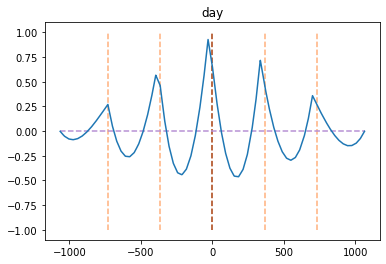

In [653]:

sample1 = dfci['month'][lag:]
sample2 = dfci['month'][:-lag]
crosscor = signal.correlate(sample1,sample2, mode='full')
crosscor /=sample1.std()*sample2.std()*len(sample2)
lags = signal.correlation_lags(len(sample1), len(sample2), mode='full')
plt.plot(lags,crosscor)
for k in range(-len(years)+1,len(years)):
    if k==0:
        plt.vlines(0, -1, 1,linestyles='dashed',color='xkcd:rust')
    else:
        plt.vlines(365*k, -1, 1,linestyles='dashed',color='xkcd:peach')
plt.hlines(0,lags[0],lags[-1],linestyles='dashed',color='xkcd:pale purple')
plt.title('day')

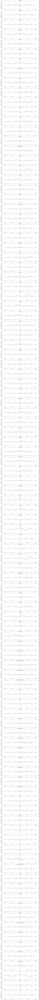

In [654]:
key1 = 'mean_chla'
fig,ax = plt.subplots(len(dfci.keys()),1,figsize=(15,4*(len(dfci.keys()))))

for idx,key2 in enumerate(dfci.keys()):
    crosscor = signal.correlate(dfci[key1],dfci[key2], mode='full')
    crosscor /=dfci[key1].std()*dfci[key2].std()*len(dfci[key1])
    lags = signal.correlation_lags(len(dfci[key1]), len(dfci[key2]), mode='full')
    ax[idx].plot(lags,crosscor)
    for k in range(-len(years)+1,len(years)):
        if k==0:
            ax[idx].vlines(0, -1, 1,linestyles='dashed',color='xkcd:rust')
        else:
            ax[idx].vlines(365*k, -1, 1,linestyles='dashed',color='xkcd:peach')
    ax[idx].hlines(0,lags[0],lags[-1],linestyles='dashed',color='xkcd:pale purple')
    ax[idx].set_title(key2)

C:\Users\valla\AppData\Local\Temp\ipykernel_11092\1936078036.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(1,figsize=(15,5))


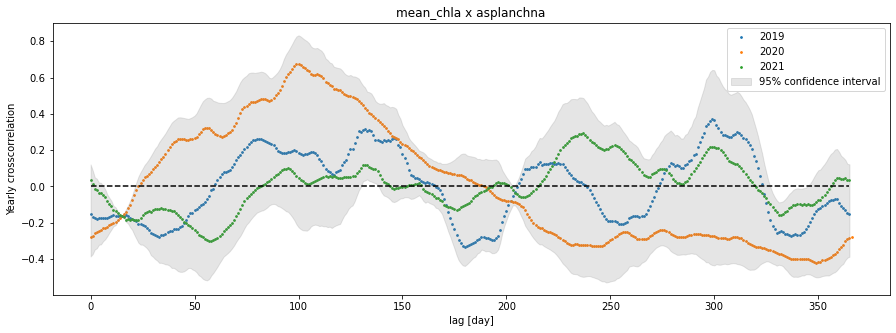

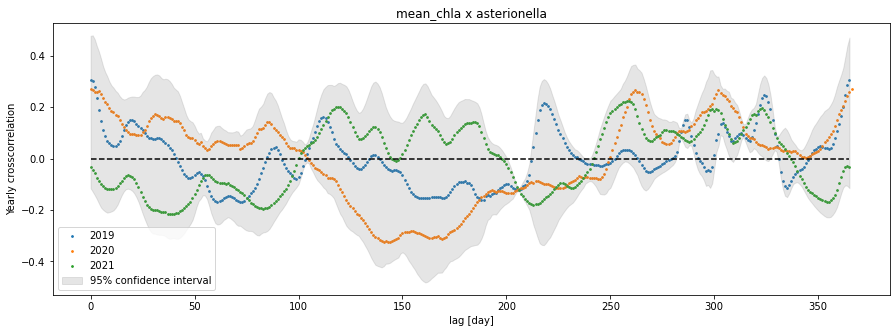

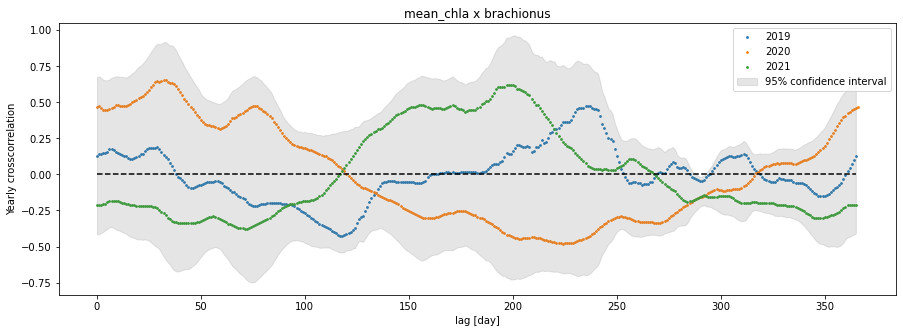

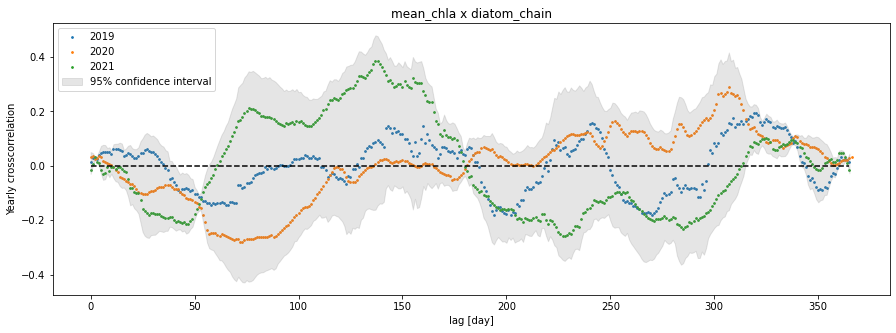

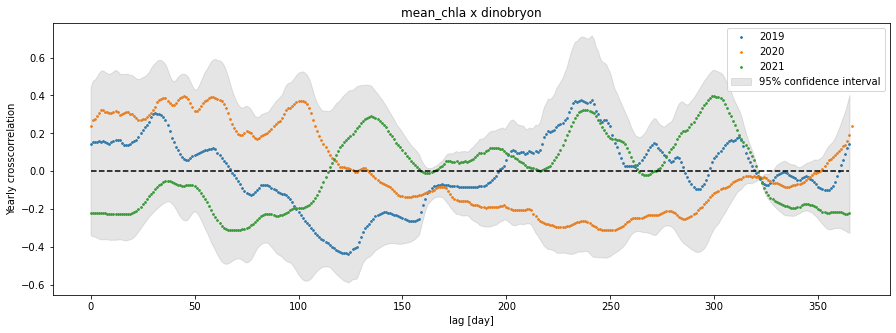

...

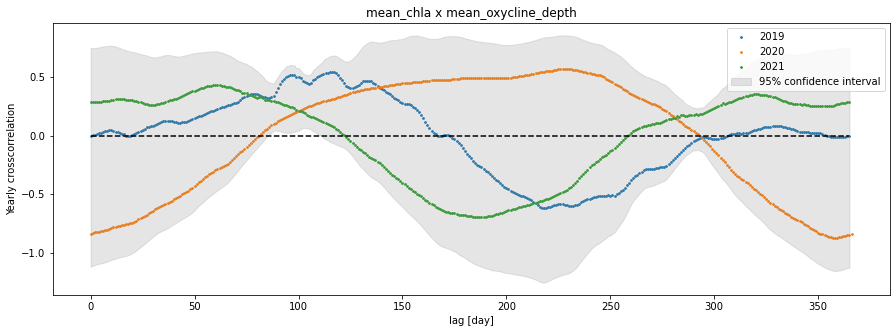

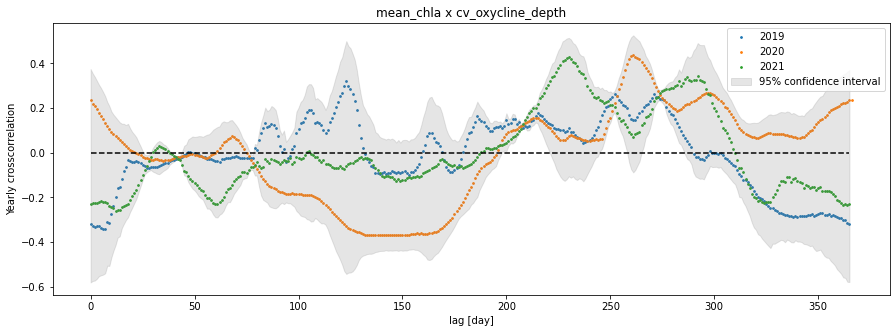

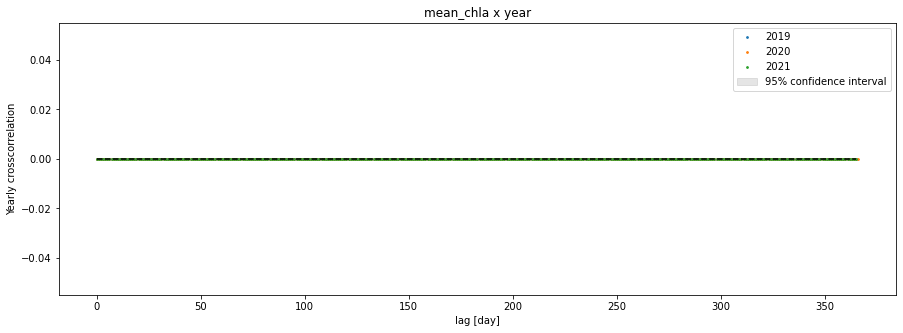

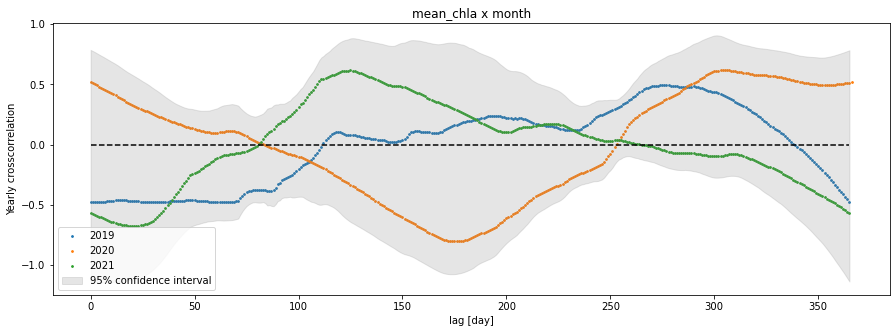

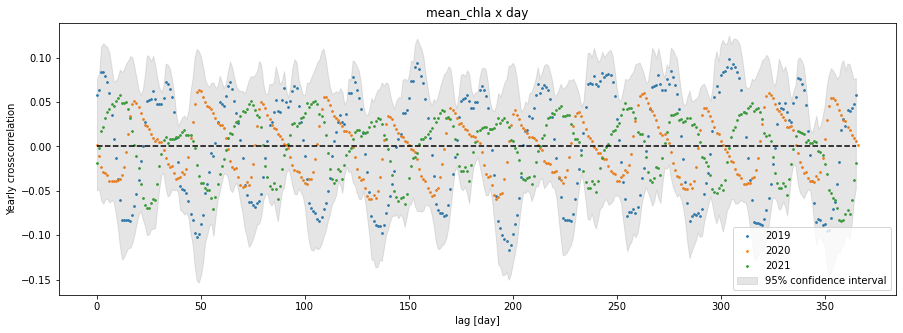

In [314]:
pp = PdfPages('crosscor.pdf')

key1 = 'mean_chla'

years = dfi['year'].unique()
df_y = dfi[dfi['year']==years[0]]
crosscor_a = np.zeros((len(years),len(df_y)+1))

for key2 in dfci.keys():
    fig,ax = plt.subplots(1,figsize=(15,5))


    for idx,year in enumerate(years):
        df_y = dfi[dfi['year']==year]
        #saturate at the 99th percentile
        df_y = df_y.clip(lower=df.quantile(0.01),upper=df.quantile(0.99),axis=1)
        dfc_y = df_y-df_y.mean()
        dfc_y = dfc_y.fillna(0)
        crosscor = signal.correlate(dfc_y[key1],dfc_y[key2].append(dfc_y[key2]), mode='valid').astype(float)
        crosscor /= dfc_y[key1].std()*dfc_y[key2].std()*len(dfc_y[key1])+0.0001
        crosscor_a[idx,:] = crosscor[:crosscor_a.shape[1]]
        lags = signal.correlation_lags(2*len(dfc_y[key2]), len(dfc_y[key1]), mode='valid')

        ax.scatter(lags,crosscor,s=3)

    ax.set_xlabel("lag [day]")
    ax.set_ylabel("Yearly crosscorrelation")
    mean = np.mean(crosscor_a,axis=0)
    std = np.std(crosscor_a,axis=0)
    ax.fill_between(lags, mean - 1.96*std, mean + 1.96*std,
                     color='gray', alpha=0.2)
    ax.legend([2019,2020,2021,"95% confidence interval"])
    ax.hlines(0,lags[0],lags[-1],linestyles='dashed',color='black')
    ax.set_title(f"{key1} x {key2}")
    pp.savefig()
pp.close()

### Time lag & max cross correlation

In [509]:
key1 = 'mean_chla'
min_lag = 30
max_lag = 395 #to eliminate spurious correlations


min_lag+=len(dfci)-1
max_lag+=len(dfci)-1
summary = []
for idx,key2 in enumerate(dfci.keys()):
    el = {}
    el['key']=key2
    crosscor = signal.correlate(dfci[key1],dfci[key2], mode='full')
    crosscor /=dfci[key1].std()*dfci[key2].std()*len(dfci[key1])
    timelags = signal.correlation_lags(len(dfci[key1]), len(dfci[key2]), mode='full')
    best_cor = np.max(np.abs(crosscor[min_lag:max_lag]))
    best_lag = timelags[np.argmax(np.abs(crosscor[min_lag:max_lag]))+min_lag]
    el['cor']=best_cor
    el['lag']=best_lag
    summary.append(el)
summary.sort(key=lambda x: x['cor'],reverse=True)

print("{:20s}".format('key')+"{:5s}".format('lag')+"{:10s}".format('correlation (abs)'))
for el in summary:
    msg = "{:18s}".format(el['key'])+"{:5n}".format(el['lag'])+"{:10.4f}".format(el['cor'])
    print(msg)
def find_lag(key1,df,min_lag,max_lag):
    min_lag+=len(df)-1
    max_lag+=len(df)-1
    summary = []
    for idx,key2 in enumerate(df.keys()):
        el = {}
        el['key']=key2
        crosscor = signal.correlate(df[key1],df[key2], mode='full')
        crosscor /=df[key1].std()*df[key2].std()*len(df[key1])
        timelags = signal.correlation_lags(len(df[key1]), len(df[key2]), mode='full')
        best_cor = np.max(np.abs(crosscor[min_lag:max_lag]))
        best_lag = timelags[np.argmax(np.abs(crosscor[min_lag:max_lag]))+min_lag]
        el['cor']=best_cor
        el['lag']=best_lag
        summary.append(el)
    return summary


key                 lag  correlation (abs)
mean_turb           301    0.4761
mean_chla            30    0.4469
mean_o2ppm          132    0.4229
Ammonium             72    0.4194
mean_ph             371    0.4087
Nitrit              208    0.3728
year                 30    0.3632
mean_o2             132    0.3276
oP                  394    0.3225
TP                  394    0.3110
TN                  319    0.2955
month                30    0.2779
Nitrat              321    0.2554
rel_air_humidity_mean  361    0.2099
mean_condF          262    0.1926
temp_mean           106    0.1724
atmospheric_pressure_mean   78    0.1625
mean_cloud_cover    372    0.1595
sunshine_duration   361    0.1457
windspeed_max       364    0.1451
windspeed_mean      365    0.1392
mean_temp            95    0.1313
mean_global_radiation  322    0.1132
precipitation_tot   148    0.0943
day                 380    0.0360


## Random Forest baseline:


In [1218]:
df.keys().drop('Datetime')

Index(['asplanchna', 'asterionella', 'brachionus', 'diatom_chain', 'dinobryon',
       'eudiaptomus', 'kellikottia', 'keratella_quadrata', 'nauplius',
       'polyarthra',
       ...
       'mean_epi_temp', 'cv_epi_temp', 'mean_mixed_layer_depth',
       'cv_mixed_layer_depth', 'ml_irradiance', 'mean_oxycline_depth',
       'cv_oxycline_depth', 'year', 'month', 'day'],
      dtype='object', length=103)

In [1219]:
#build train and val datasets
df_t, df_v = sklearn.model_selection.train_test_split(df, test_size=0.1, shuffle=False)
df_v.reset_index(inplace=True)
df_tnorm = pd.DataFrame()
df_vnorm = pd.DataFrame()
#datetime format changed into relative day since start
df_tnorm['Datetime'] = df_t['Datetime']-df_t['Datetime'][0]
df_vnorm['Datetime'] = df_v['Datetime']-df_t['Datetime'][0]

keys_float = df.keys().drop('Datetime') 
df_tnorm[keys_float] = (df_t[keys_float]-df_t[keys_float].mean())/df_t[keys_float].std()
df_vnorm[keys_float] = df_v[keys_float]-df_t[keys_float].mean()/df_t[keys_float].std()



In [1220]:
lag = 1
inkey = dfci.keys()
outkey = dfci.keys()
#create the outputs (only use the valid ones):
len_t = int(len(dfci)*(1-val_split))
df_t = dfci[:len_t]
mean_t = df_t.mean()
var_t = df_t.var()
df_t = (df_t-mean_t)/var_t
df_v = (dfci[len_t:]-mean_t)/var_t

Xt = df_t[:-lag][inkey]
yt = df_t[lag:][outkey]
Xv = df_v[:-lag][inkey]
yv = df_v[lag:][outkey]

As one can see, the coefficient of determination of the model is worth than a simple average at a lag time of 30 days, and even with a one day lag, it appears to be extremely bad at generalizing.

In [1221]:
Rv = []
Rt = []
R_oob = []
max_lag = 30
for lag in range(1,max_lag):
    print(lag,end="\r")
    model = sklearn.ensemble.RandomForestRegressor(oob_score=True)
    
    
    Xt = df_t[:-lag]
    yt = df_t[lag:]
    Xv = df_v[:-lag]
    yv = df_v[lag:]
    model.fit(Xt,yt)
    Rv.append(model.score(Xv,yv))
    Rt.append(model.score(Xt,yt))
    R_oob.append(model.oob_score_)
print("                        ")

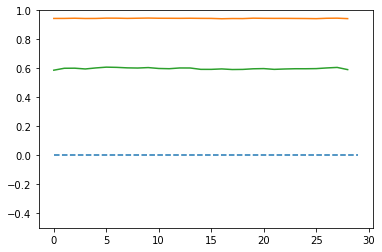

In [318]:
plt.plot(Rv)
plt.plot(Rt)
plt.plot(R_oob)
plt.ylim(-0.5, 1)
plt.hlines(0,0,len(Rv), linestyle='dashed')

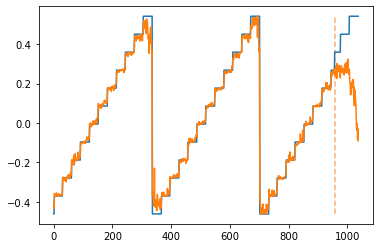

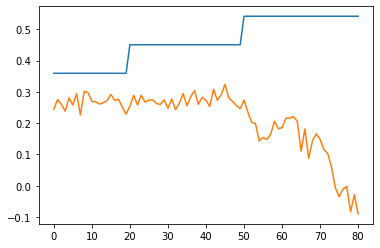

In [319]:
key = 'month'
idx = Xt.keys().get_loc(key)

plt.plot(range(len(yt)+len(yv)),yt[key].append(yv[key]))
plt.plot(range(len(yt)+len(yv)),model.predict(Xt.append(Xv))[:,idx])
plt.vlines(len(yt),np.min(yt[key].append(yv[key])),np.max(yt[key].append(yv[key])),linestyles='dashed',color='xkcd:peach')
plt.show()
plt.plot(range(len(yv)),yv[key])
plt.plot(range(len(yv)),model.predict(Xv)[:,idx])
plt.show()

The visualization of the time series confirms that the dimentionality of the dataset makes it extremely difficult to generalize the models

## Bootstraping

In [1213]:
outkey=['mean_chla','mean_temp']
inkey = outkey
Xt = df_t[:-1][inkey]
yt = df_t[1:][outkey]
Xv = df_v[:-1][inkey]
yv = df_v[1:][outkey]
Xt.reset_index(inplace=True,drop=True)
yt.reset_index(inplace=True,drop=True)
Xv.reset_index(inplace=True,drop=True)
yv.reset_index(inplace=True,drop=True)


In [1214]:
def R2(trues,preds):
    errs2 = np.sum(np.sum(np.square(trues-preds)))
    tot2 = np.sum(np.sum(np.square(trues-np.mean(trues))))
    return 1-errs2/(tot2+0.00001)

In [1215]:
model = sklearn.ensemble.RandomForestRegressor(n_estimators=200,oob_score=True)

model.fit(Xt,yt)
print(model.score(Xv,yv))

0.9061890054395524


In [1216]:
max_lag = 30
Rv_b = []
#initiate pred
idx = yv.keys().get_loc('mean_chla')
pred = model.predict(Xv)
Rv_b.append(R2(yv,pred))
for lag in range(1,max_lag):
    #always drop the last item as it wont have a target
    pred = model.predict(pred)[:-1]
    Rv_b.append(R2(yv[lag:]['mean_chla'],pred[:,idx]))

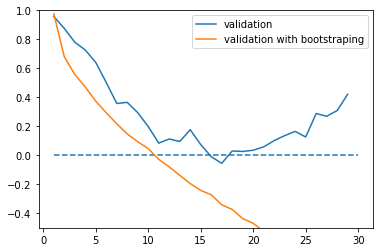

In [1217]:
fig,ax = plt.subplots(1)
ax.plot(range(1,max_lag),Rv_f)
ax.plot(range(1,max_lag+1),Rv_b)
ax.set_ylim(-0.5, 1)
ax.hlines(0,1,len(Rv_b), linestyle='dashed')
ax.legend(['validation','validation with bootstraping'])

As bootstraping seemingly increace greatly the prediction capabilities, features are slowly added:

In [1202]:
df_v[df_t.keys()]

,asplanchna,asterionella,brachionus,diatom_chain,dinobryon,eudiaptomus,kellikottia,keratella_quadrata,nauplius,polyarthra,...,mean_epi_temp,cv_epi_temp,mean_mixed_layer_depth,cv_mixed_layer_depth,ml_irradiance,mean_oxycline_depth,cv_oxycline_depth,year,month,day
876,-136.983912,21.011817,24.888111,861.581312,-0.461214,578.495752,-187.566971,-41.694545,-14.551535,-119.682557,...,0.013762,2.121921,0.270566,-1.744895,-0.022265,0.238479,-4.183246,2.40737,-0.07687,0.134969
877,-133.067458,41.278161,-5.873313,1621.400771,-0.359552,866.817855,-70.461740,5.641002,-3.414087,-82.977704,...,0.017615,-10.567740,0.177039,-0.998144,-0.040031,0.238479,-4.183246,2.40737,-0.07687,0.147986
878,-113.485073,87.116012,50.917006,1345.103600,-0.214345,767.964600,-64.298256,91.436694,26.251076,-82.977704,...,0.027184,-11.131088,0.242332,-1.211141,-0.015430,0.238479,-4.183246,2.40737,-0.07687,0.161003
879,-78.236757,106.558020,138.468716,1621.400771,0.169302,566.139110,-64.298256,144.689190,117.952863,-60.954707,...,0.019805,-19.513588,0.011161,-3.253634,-0.007400,0.238479,-4.183246,2.40737,-0.07687,0.174020
880,-19.489545,90.686993,169.230141,723.433224,0.661810,969.790030,-2.663942,295.571233,180.718104,-90.318632,...,0.031730,-5.143920,0.002337,-1.665639,-0.007383,0.238479,-4.183246,2.40737,-0.07687,0.187037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,-97.819142,-0.995550,-100.523801,-381.803205,-0.543562,-47.575081,-384.796880,-124.531784,-24.544012,-119.682557,...,-0.217988,-35.164908,-0.327655,2.372133,-0.041035,0.027382,33.071422,2.40737,0.50435,0.147986
1092,-125.234492,-1.002394,-114.721389,-381.803205,-0.542333,5.970407,-323.162567,-124.531784,-25.897158,-119.682557,...,-0.218325,-33.015716,-0.387654,-5.341950,-0.043211,0.238479,-4.183246,2.40737,0.50435,0.161003
1093,-129.151003,-0.995550,-114.721389,-381.803205,-0.543211,-35.218439,-347.816327,-124.531784,-26.313512,-119.682557,...,-0.218464,-31.309511,-0.073543,13.391326,-0.042234,0.238479,-4.183246,2.40737,0.50435,0.174020
1094,-105.652107,-0.988709,-109.988859,-450.833484,-0.543562,-68.169564,-353.979723,-130.448733,-21.733628,-119.682557,...,-0.216152,-26.045683,-0.370007,-3.438283,-0.038756,0.238479,-4.183246,2.40737,0.50435,0.187037


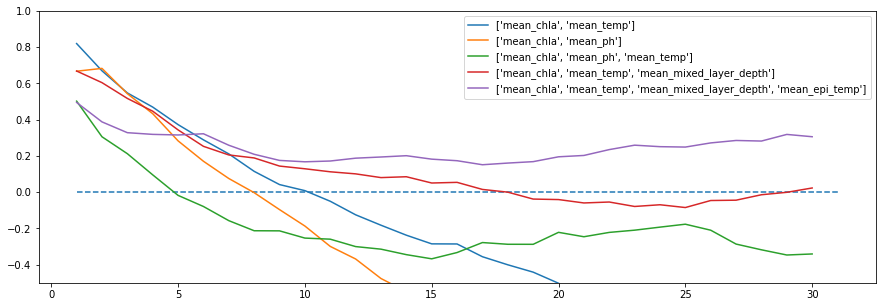

In [1201]:
def RF_bootstrap(df_t, df_v,max_lag,keys):
    inkey = keys
    outkey = keys
    Xt = df_t[:-1][inkey]
    yt = df_t[1:][outkey]
    Xv = df_v[:-1][inkey]
    yv = df_v[1:][outkey]
    Xt.reset_index(inplace=True,drop=True)
    yt.reset_index(inplace=True,drop=True)
    Xv.reset_index(inplace=True,drop=True)
    yv.reset_index(inplace=True,drop=True)
    
    model = sklearn.ensemble.RandomForestRegressor(n_estimators=200)
    model.fit(Xt,yt)
    idx = yv.keys().get_loc('mean_chla')
    pred = model.predict(Xv)
    Rv=[R2(yv['mean_chla'],pred[:,idx])]
    for lag in range(1,max_lag):
        #always drop the last item as it wont have a target
        pred = model.predict(pred)[:-1]
        Rv.append(R2(yv[lag:]['mean_chla'],pred[:,idx]))
    return Rv



list_test = [['mean_chla','mean_temp'],
             ['mean_chla','mean_ph'],
             ['mean_chla','mean_ph','mean_temp'],
             ['mean_chla','mean_temp','mean_mixed_layer_depth'],
             ['mean_chla','mean_temp','mean_mixed_layer_depth','mean_epi_temp']
             ]

max_lag = 30


fig,ax = plt.subplots(1,figsize=(15,5))
for keys in list_test:
    ax.plot(range(1,max_lag+1),RF_bootstrap(df_t,df_v,max_lag,keys))


ax.set_ylim(-0.5, 1)
ax.hlines(0,1,max_lag+1, linestyle='dashed')
ax.legend(list_test)

In [1199]:
df_t.var()

asplanchna              56397.305058
asterionella               49.254911
brachionus              34074.184914
diatom_chain           994672.601517
dinobryon                   2.528385
                           ...      
mean_oxycline_depth         0.077113
cv_oxycline_depth          98.069936
year                        1.924139
month                       0.083031
day                         0.013017
Length: 103, dtype: float64

# Focussing on only one dimention
A way to improve the result would be to train the random forest to only predict the chla, rather than the whole dimentionaly of the time series. 

In [1114]:
model = sklearn.ensemble.RandomForestRegressor(n_estimators=100,oob_score=True)
lag = 30
val_split = 0.1
inkey = dfci.keys()#['day','month','mean_chla']
outkey = 'mean_chla'

len_t = int(len(dfci)*(1-val_split))
df_t = dfci[:len_t]
mean_t = df_t.mean()
var_t = df_t.var()
df_t = (df_t-mean_t)/var_t
df_v = (dfci[len_t:]-mean_t)/var_t

Xt = df_t[:-lag][inkey]
yt = df_t[lag:][outkey]
Xv = df_v[:-lag][inkey]
yv = df_v[lag:][outkey]
model.fit(Xt,yt)
print(model.score(Xv,yv))

0.500929092854727


In [1115]:
Rv_f = []
Rt_f = []
R_oob_f = []
max_lag = 30
for lag in range(1,max_lag):
    print(lag,end="\r")
    model = sklearn.ensemble.RandomForestRegressor(oob_score=True)
    
    
    Xt = df_t[:-lag][inkey]
    yt = df_t[lag:][outkey]
    Xv = df_v[:-lag][inkey]
    yv = df_v[lag:][outkey]
    model.fit(Xt,yt)
    Rv_f.append(model.score(Xv,yv))
    Rt_f.append(model.score(Xt,yt))
    R_oob_f.append(model.oob_score_)
print("Done  ")

Done  


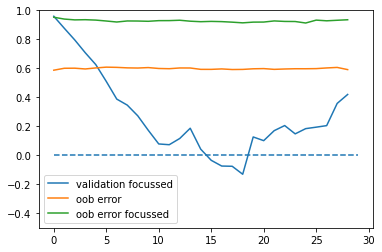

In [322]:
fig,ax = plt.subplots(1)
ax.plot(Rv_f)
ax.plot(R_oob)
ax.plot(R_oob_f)
ax.set_ylim(-0.5, 1)
ax.hlines(0,0,len(Rv), linestyle='dashed')
ax.legend(['validation focussed','oob error','oob error focussed'])

In [324]:
import sklearn.feature_selection
selector=sklearn.feature_selection.RFECV(model, step=2, min_features_to_select=3,verbose=2, n_jobs=3)

In [325]:
selector.fit(Xt,yt)

Fitting estimator with 103 features.
Fitting estimator with 101 features.
Fitting estimator with 99 features.
Fitting estimator with 97 features.
Fitting estimator with 95 features.
Fitting estimator with 93 features.
Fitting estimator with 91 features.
Fitting estimator with 89 features.
Fitting estimator with 87 features.
Fitting estimator with 85 features.
Fitting estimator with 83 features.
Fitting estimator with 81 features.
Fitting estimator with 79 features.
Fitting estimator with 77 features.
Fitting estimator with 75 features.
Fitting estimator with 73 features.
Fitting estimator with 71 features.
Fitting estimator with 69 features.
Fitting estimator with 67 features.
Fitting estimator with 65 features.
Fitting estimator with 63 features.
Fitting estimator with 61 features.
Fitting estimator with 59 features.
Fitting estimator with 57 features.
Fitting estimator with 55 features.


RFECV(estimator=RandomForestRegressor(oob_score=True), min_features_to_select=3,
      n_jobs=3, step=2, verbose=2)

In [326]:
inkey = dfci.keys()[selector.support_]
inkey

Index(['asterionella', 'brachionus', 'dinobryon', 'eudiaptomus', 'kellikottia',
       'keratella_quadrata', 'nauplius', 'rotifers', 'synchaeta', 'ceratium',
       'cyclops', 'fragilaria', 'cluster_1', 'cluster_2', 'cluster_3',
       'cluster_4', 'cluster_6', 'cluster_7', 'cluster_8', 'diatom',
       'mean_temp', 'cv_temp_depth', 'mean_condF', 'cv_condF_depth', 'mean_o2',
       'mean_o2ppm', 'cv_o2ppm_day', 'cv_o2ppm_depth', 'mean_ph',
       'cv_ph_depth', 'mean_chla', 'mean_turb', 'cv_turb_day', 'mean_phycoer',
       'cv_phycoer_depth', 'mean_phy', 'cv_phy_depth',
       'atmospheric_pressure_min', 'temp_max', 'sunshine_duration', 'Nitrat',
       'Nitrit', 'Ammonium', 'oP', 'TP', 'TN', 'TOC', 'mean_schmidt',
       'mean_epi_temp', 'mean_mixed_layer_depth', 'year', 'month', 'day'],
      dtype='object')

In [327]:
inkey = dfci.keys()[selector.support_]
Rv_s= []
Rt_s = []
R_oob_s = []
max_lag = 30
for lag in range(1,max_lag):
    print(lag,end="\r")
    model = sklearn.ensemble.RandomForestRegressor(oob_score=True)
    
    
    Xt = df_t[:-lag][inkey]
    yt = df_t[lag:][outkey]
    Xv = df_v[:-lag][inkey]
    yv = df_v[lag:][outkey]
    model.fit(Xt,yt)
    Rv_s.append(model.score(Xv,yv))
    Rt_s.append(model.score(Xt,yt))
    R_oob_s.append(model.oob_score_)
print("Done")

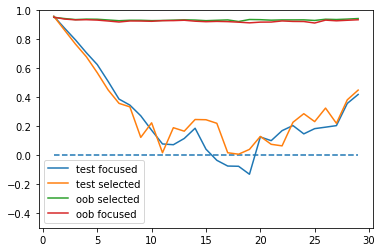

In [332]:
fig,ax = plt.subplots(1)
ax.plot(range(1,max_lag),Rv_f)
ax.plot(range(1,max_lag),Rv_s)
ax.plot(range(1,max_lag),R_oob_s)
ax.plot(range(1,max_lag),R_oob_f)
ax.set_ylim(-0.5, 1)
ax.hlines(0,1,len(Rv), linestyle='dashed')
ax.legend(['test focused','test selected','oob selected','oob focused'])

Dropping features this way seems to slightly improve the result

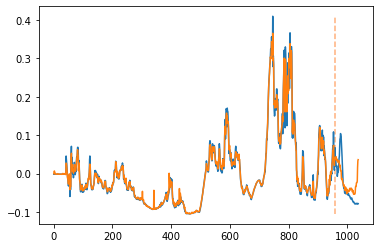

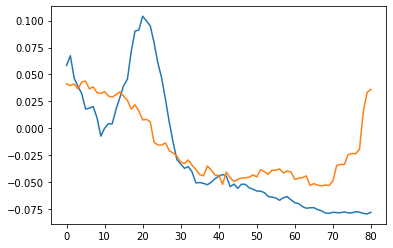

In [329]:
key = 'month'

try:
    yt = yt[key]
    yv = yv[key]
except:
    pass
    
idx = Xt.keys().get_loc(key)

plt.plot(range(len(yt)+len(yv)),yt.append(yv))
plt.plot(range(len(yt)+len(yv)),model.predict(Xt.append(Xv)))
plt.vlines(len(yt),np.min(yt.append(yv)),np.max(yt.append(yv)),linestyles='dashed',color='xkcd:peach')
plt.show()
plt.plot(range(len(yv)),yv)
plt.plot(range(len(yv)),model.predict(Xv))
plt.show()

## Hyper parameters tuning
To improve the fit, several hyper parameters can be tuned:

In [655]:
from sklearn.metrics import make_scorer
from sklearn import model_selection

In [658]:
estimator = sklearn.ensemble.RandomForestRegressor()
param_grid = [
  {'ccp_alpha': [0.0],
   'criterion': ['squared_error'],
   'max_features': ["auto","sqrt","log2"],
   'max_leaf_nodes': [100,200,None],
   'max_samples': [None],
   'min_impurity_decrease': [0.0],
   'min_samples_split': [2,3,4,8], 
   'min_samples_leaf': [1],#controlled by the split
   'n_estimators': [50,100],
  }
 ]

gridsearch = model_selection.GridSearchCV(estimator, param_grid, n_jobs=-1, refit=False, cv=36,
                                          verbose=2, pre_dispatch='2*n_jobs', 
                                          return_train_score=False)

In [659]:
rdinkey = dfci.keys()#[selector.support_]
outkey = 'mean_chla'
lag = 30
    
Xt = df_t[:-lag][inkey]
yt = df_t[lag:][outkey]
Xv = df_v[:-lag][inkey]
yv = df_v[lag:][outkey]

gridsearch.fit(Xt,yt)

Fitting 36 folds for each of 72 candidates, totalling 2592 fits


GridSearchCV(cv=36, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid=[{'ccp_alpha': [0.0], 'criterion': ['squared_error'],
                          'max_features': ['auto', 'sqrt', 'log2'],
                          'max_leaf_nodes': [100, 200, None],
                          'max_samples': [None], 'min_impurity_decrease': [0.0],
                          'min_samples_leaf': [1],
                          'min_samples_split': [2, 3, 4, 8],
                          'n_estimators': [50, 100]}],
             refit=False, verbose=2)

Text(0, 0.5, 'std test score')

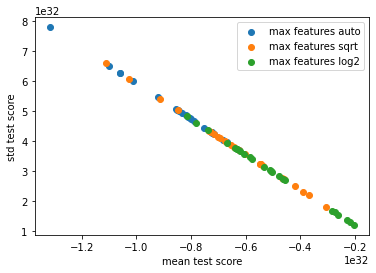

In [660]:
res = pd.DataFrame(gridsearch.cv_results_)
res_sorted = res.sort_values('mean_test_score')
plt.scatter(res_sorted[res_sorted['param_max_features']=='auto']['mean_test_score'],
            res_sorted[res_sorted['param_max_features']=='auto']['std_test_score'])
plt.scatter(res_sorted[res_sorted['param_max_features']=='sqrt']['mean_test_score'],
            res_sorted[res_sorted['param_max_features']=='sqrt']['std_test_score'])
plt.scatter(res_sorted[res_sorted['param_max_features']=='log2']['mean_test_score'],
            res_sorted[res_sorted['param_max_features']=='log2']['std_test_score'])
plt.legend(["max features auto","max features sqrt","max features log2"])
plt.xlabel("mean test score")
plt.ylabel("std test score")

In [661]:
res_filtered= res_sorted[(res_sorted['param_max_features']=='log2')]

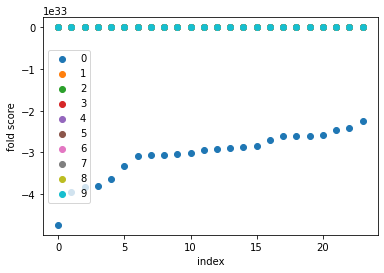

Text(0, 0.5, 'fold score')

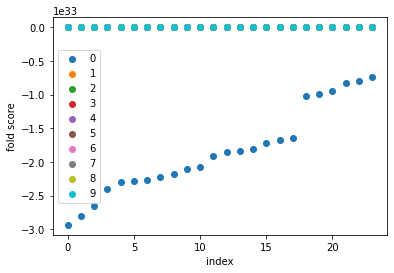

In [662]:
res_col = ['split'+str(val)+'_test_score'for val in range(10)]
res_auto = res_sorted[(res_sorted['param_max_features']=='auto')][res_col]
leg = []
for idx,col in enumerate(res_col):
    plt.scatter(range(len(res_auto)),res_auto[col])
    leg.append(idx)
plt.legend(leg)
plt.xlabel("index")
plt.ylabel("fold score")
plt.show()
res_col = ['split'+str(val)+'_test_score'for val in range(10)]
res_auto = res_sorted[(res_sorted['param_max_features']=='log2')][res_col]
leg = []
for idx,col in enumerate(res_col):
    plt.scatter(range(len(res_auto)),res_auto[col])
    leg.append(idx)
plt.legend(leg)
plt.xlabel("index")
plt.ylabel("fold score")

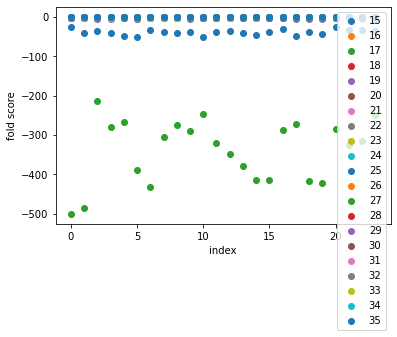

In [669]:
res_col = ['split'+str(val)+'_test_score'for val in range(36)]
res_auto = res_sorted[(res_sorted['param_max_features']=='auto')][res_col]
leg = []
for idx,col in enumerate(res_col):
    if idx<15:
        continue
    plt.scatter(range(len(res_auto)),res_auto[col])
    leg.append(idx)
plt.legend(leg)
plt.xlabel("index")
plt.ylabel("fold score")
plt.show()

In [ ]:
17

The auto feature selection will be not be used as it is clearly worse than the two other methods

Text(0, 0.5, 'std test score')

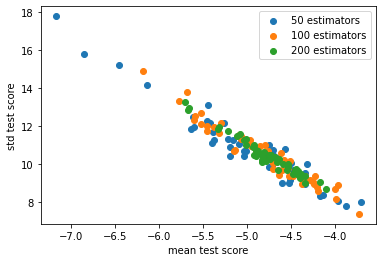

In [566]:
df = res_filtered
plt.scatter(df[df['param_n_estimators']==50]['mean_test_score'],
            df[df['param_n_estimators']==50]['std_test_score'])
plt.scatter(df[df['param_n_estimators']==100]['mean_test_score'],
            df[df['param_n_estimators']==100]['std_test_score'])
plt.scatter(df[df['param_n_estimators']==200]['mean_test_score'],
            df[df['param_n_estimators']==200]['std_test_score'])
plt.legend(["50 estimators","100 estimators","200 estimators"])
plt.xlabel("mean test score")
plt.ylabel("std test score")

An increased number of estimators is reducing the influence of other parameters. Thus only 50 estimators will be displayed to increase visiblility

In [567]:
res_filtered2= res_filtered[res_filtered['param_n_estimators']==50]

Text(0, 0.5, 'std test score')

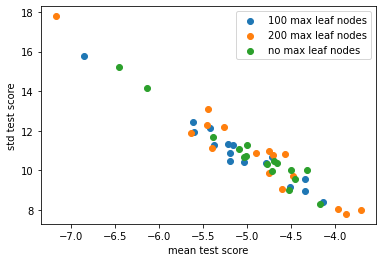

In [568]:
df = res_filtered2
plt.scatter(df[df['param_max_leaf_nodes']==100]['mean_test_score'],
            df[df['param_max_leaf_nodes']==100]['std_test_score'])
plt.scatter(df[df['param_max_leaf_nodes']==200]['mean_test_score'],
            df[df['param_max_leaf_nodes']==200]['std_test_score'])
plt.scatter(df[df['param_max_leaf_nodes'].isnull()]['mean_test_score'],
            df[df['param_max_leaf_nodes'].isnull()]['std_test_score'])
plt.legend(["100 max leaf nodes","200 max leaf nodes","no max leaf nodes"])
plt.xlabel("mean test score")
plt.ylabel("std test score")

No significant influence can be noted

Text(0, 0.5, 'std test score')

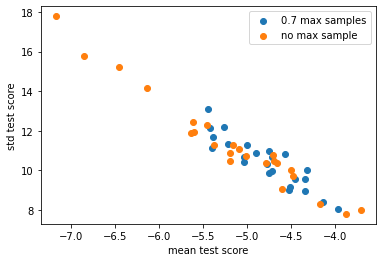

In [569]:
df = res_filtered2
param = 'param_max_samples'
plt.scatter(df[df[param]==0.7]['mean_test_score'],
            df[df[param]==0.7]['std_test_score'])
plt.scatter(df[df[param].isnull()]['mean_test_score'],
            df[df[param].isnull()]['std_test_score'])
plt.legend(["0.7 max samples","no max sample"])
plt.xlabel("mean test score")
plt.ylabel("std test score")

No significant impact

Text(0, 0.5, 'std test score')

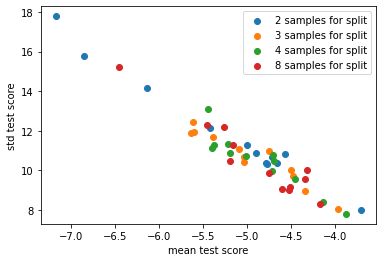

In [572]:
df = res_filtered2
param = 'param_min_samples_split'
plt.scatter(df[df[param]==2]['mean_test_score'],
            df[df[param]==2]['std_test_score'])
plt.scatter(df[df[param]==3]['mean_test_score'],
            df[df[param]==3]['std_test_score'])
plt.scatter(df[df[param]==4]['mean_test_score'],
            df[df[param]==4]['std_test_score'])
plt.scatter(df[df[param]==8]['mean_test_score'],
            df[df[param]==8]['std_test_score'])
plt.legend(["2 samples for split","3 samples for split",'4 samples for split','8 samples for split'])
plt.xlabel("mean test score")
plt.ylabel("std test score")

4 samples are slightly increasing the mean score

In [573]:
res_filtered3 = res_filtered2[res_filtered2['param_min_samples_split']==4]

In [586]:
gridsearch.best_params_

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_features': 'log2',
 'max_leaf_nodes': 200,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 50}

In [621]:
estimator = sklearn.ensemble.RandomForestRegressor(
                                                    ccp_alpha= 0.0,
                                                    criterion= 'squared_error',
                                                    max_features= 'auto',
                                                    max_leaf_nodes= None,
                                                    max_samples= None,
                                                    min_impurity_decrease= 0.0,
                                                    min_samples_leaf= 1,
                                                    min_samples_split= 4,
                                                    n_estimators= 200
                                                    )
estimator.fit(Xt,yt)
print(estimator.score(Xv,yv))

0.5084632032168874


In [981]:
key = 'month'

try:
    yt = yt[key]
    yv = yv[key]
except:
    pass
    
#idx = Xt.keys().get_loc(key)
model=model
estimator.fit(Xt,yt)
plt.plot(range(len(yt)+len(yv)),yt.append(yv))
plt.plot(range(len(yt)+len(yv)),model.predict(Xt.append(Xv)))
plt.vlines(len(yt),np.min(yt.append(yv)),np.max(yt.append(yv)),linestyles='dashed',color='xkcd:peach')
plt.show()
plt.plot(range(len(yv)),yv)
plt.plot(range(len(yv)),model.predict(Xv))
plt.show()

AttributeError: 'numpy.ndarray' object has no attribute 'append'

The random forest seems unable to fit the time series, due to the high variance in the score when doing a k-fold cross validation

## Hyper parameters tuning on reduced dimentionality

In [553]:
estimator = sklearn.ensemble.RandomForestRegressor()
param_grid = [
  {'ccp_alpha': [0.0],
   'criterion': ['squared_error'],
   'max_features': ["sqrt","log2"], 
   'max_leaf_nodes': [None],
   'max_samples': [None],
   'min_impurity_decrease': [0.0,0.1 ],
   'min_samples_split': [2], #controlled by the min samples leaf instead 
   'min_samples_leaf': [1,2,4,8],
   'n_estimators': [50,100,200,500],
  }
 ]

gridsearch_s = model_selection.GridSearchCV(estimator, param_grid, n_jobs=-1, refit=False, cv=10,
                                          verbose=2, pre_dispatch='2*n_jobs', 
                                          return_train_score=False)

In [554]:
inkey = dfci.keys()[selector.support_]
outkey = 'mean_chla'
lag = 30
    
Xt = df_t[:-lag][inkey]
yt = df_t[lag:][outkey]
Xv = df_v[:-lag][inkey]
yv = df_v[lag:][outkey]

gridsearch_s.fit(Xt,yt)

Fitting 10 folds for each of 64 candidates, totalling 640 fits


GridSearchCV(cv=10, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid=[{'ccp_alpha': [0.0], 'criterion': ['squared_error'],
                          'max_features': ['sqrt', 'log2'],
                          'max_leaf_nodes': [None], 'max_samples': [None],
                          'min_impurity_decrease': [0.0, 0.1],
                          'min_samples_leaf': [1, 2, 4, 8],
                          'min_samples_split': [2],
                          'n_estimators': [50, 100, 200, 500]}],
             refit=False, verbose=2)

Text(0, 0.5, 'std test score')

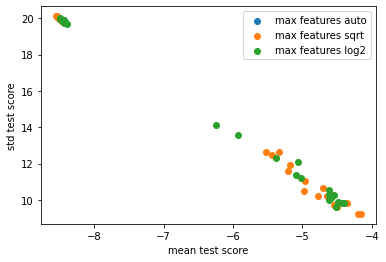

In [555]:
res = pd.DataFrame(gridsearch_s.cv_results_)
res_sorted = res.sort_values('mean_test_score')
plt.scatter(res_sorted[res_sorted['param_max_features']=='auto']['mean_test_score'],
            res_sorted[res_sorted['param_max_features']=='auto']['std_test_score'])
plt.scatter(res_sorted[res_sorted['param_max_features']=='sqrt']['mean_test_score'],
            res_sorted[res_sorted['param_max_features']=='sqrt']['std_test_score'])
plt.scatter(res_sorted[res_sorted['param_max_features']=='log2']['mean_test_score'],
            res_sorted[res_sorted['param_max_features']=='log2']['std_test_score'])
plt.legend(["max features auto","max features sqrt","max features log2"])
plt.xlabel("mean test score")
plt.ylabel("std test score")

Text(0, 0.5, 'std test score')

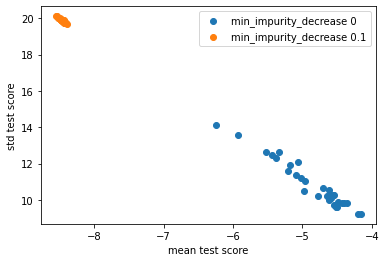

In [556]:
res = pd.DataFrame(gridsearch_s.cv_results_)
res_sorted = res.sort_values('mean_test_score')
plt.scatter(res_sorted[res_sorted['param_min_impurity_decrease']==0.0]['mean_test_score'],
            res_sorted[res_sorted['param_min_impurity_decrease']==0.0]['std_test_score'])
plt.scatter(res_sorted[res_sorted['param_min_impurity_decrease']==0.1]['mean_test_score'],
            res_sorted[res_sorted['param_min_impurity_decrease']==0.1]['std_test_score'])
plt.legend(["min_impurity_decrease 0","min_impurity_decrease 0.1"])
plt.xlabel("mean test score")
plt.ylabel("std test score")

As for the full dimentions, using a log2 or sqrt features selection in each tree is improving significantly the results.
Using no minimal impurity has the same effect

In [557]:
res_filtered= res_sorted[(res_sorted['param_max_features']=='log2')&
                         (res_sorted['param_min_impurity_decrease']==0.0)]

In [558]:
df = res_filtered
param = 'param_min_samples_leaf'
print(df[df[param]==1]['mean_test_score'].mean())
print(df[df[param]==2]['mean_test_score'].mean())
print(df[df[param]==4]['mean_test_score'].mean())
print(df[df[param]==8]['mean_test_score'].mean())

-5.073911399828971
-4.823307723754474
-4.732423714964424
-4.910917005398743


In [559]:
df = res_filtered
param = 'param_max_samples'
#print(df[df[param]==0.8]['mean_test_score'].mean()) 
print(df[df[param].isnull()]['mean_test_score'].mean())

-4.8851399609866535


n_estimators: 50 mean: -5.465487793135601 var: 0.572718872713018
n_estimators: 100 mean: -4.662271197773447 var: 0.06866684289697411
n_estimators: 200 mean: -4.7410148989605165 var: 0.18248080712702566
n_estimators: 500 mean: -4.671785954077048 var: 0.08682868515464638


Text(0, 0.5, 'std test score')

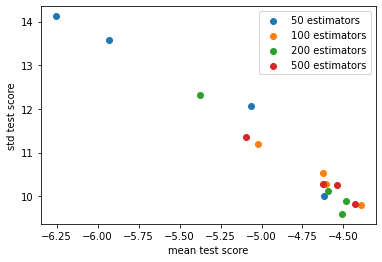

In [560]:
df = res_filtered
param = 'param_n_estimators'
for val in [50,100,200,500]:
    print(f"n_estimators: {val} mean: {df[df[param]==val]['mean_test_score'].mean()}"+
          f" var: {df[df[param]==val]['mean_test_score'].var()}")

    plt.scatter(df[df[param]==val]['mean_test_score'],
                df[df[param]==val]['std_test_score'])

plt.legend([f"{val} estimators" for val in [50,100,200,500]])
plt.xlabel("mean test score")
plt.ylabel("std test score")

Increasing the number of estimators has the effect of reducing the variance of the other factors

## New preprocessing of the data
As some of the mean_chla measurement were corrupted, a new preprocessing was tried to take them out of the training and validation sets

In [900]:
#build train and val datasets
df_t, df_v = sklearn.model_selection.train_test_split(df, test_size=0.2, shuffle=False)
df_v.reset_index(inplace=True)
df_tnorm = pd.DataFrame()
df_vnorm = pd.DataFrame()
#datetime format changed into relative day since start
df_tnorm['Datetime'] = df_t['Datetime']-df_t['Datetime'][0]
df_vnorm['Datetime'] = df_v['Datetime']-df_t['Datetime'][0]
#the other keys are standardized
keys_float = df.keys().drop('Datetime') 
df_tnorm[keys_float] = (df_t[keys_float]-df_t[keys_float].mean())/df_t[keys_float].std()
df_vnorm[keys_float] = (df_v[keys_float]-df_t[keys_float].mean())/df_t[keys_float].std()


In [1222]:
lag = 30
outkey = ['mean_chla','mean_temp']
def Xy_from_df(df, outkey,lag,inkey=df.keys()):
    #create the outputs (only use the valid ones):
    y = df[['Datetime']+outkey][~df[outkey].isnull()]
    #drop all outputs that cannot have inputs
    y = y.drop(y[y['Datetime']-np.timedelta64(lag,'D')<df['Datetime'][0]].index,axis=0)

    #interpolate the data for the inputs (just repeating the last value):
    dfi = df.interpolate(method='ffill')
    #fill the first data with 0s
    keys_float = df.keys().drop('Datetime')
    dfi[keys_float] = dfi[keys_float].fillna(0)
    #create the inputs from the outputs
    X = pd.DataFrame()

    for idx,date in enumerate(y['Datetime']-np.timedelta64(lag,'D')):
        X = X.append(dfi[dfi['Datetime']==date])

    #now that Xs and ys are created, we can drop the dates.
    X = X.drop(columns=['Datetime'])
    y = y.drop(columns=['Datetime'])
    return X,y
Xt,yt = Xy_from_df(df_tnorm,outkey,lag)
Xv,yv = Xy_from_df(df_vnorm,outkey,lag)

In [1223]:
Rv = []
Rt = []
R_oob = []
max_lag = 30
for lag in range(1,max_lag):
    print(lag,end="\r")
    model = sklearn.ensemble.RandomForestRegressor(oob_score=True)
    
    
    Xt,yt = Xy_from_df(df_tnorm,outkey,lag)
    Xv,yv = Xy_from_df(df_vnorm,outkey,lag)
    model.fit(Xt,yt)
    Rv.append(model.score(Xv,yv))
    Rt.append(model.score(Xt,yt))
    R_oob.append(model.oob_score_)
print("                        ")

ValueError: Found array with 0 sample(s) (shape=(0, 103)) while a minimum of 1 is required.

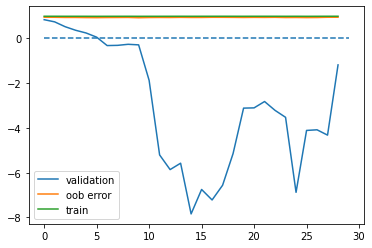

In [905]:
fig,ax = plt.subplots(1)
ax.plot(Rv)
ax.plot(R_oob)
ax.plot(Rt)
#ax.set_ylim(-0.5, 1)
ax.hlines(0,0,len(Rv), linestyle='dashed')
ax.legend(['validation','oob error','train'])

## Bootstraping prediction
all variables are predicted, and reused to compute the next day

In [907]:
model = sklearn.ensemble.RandomForestRegressor(oob_score=True)
selector=sklearn.feature_selection.RFECV(model, step=5, min_features_to_select=10,verbose=1)


Rt_f = []
Rv_f = []
R_oob_f = []
inkeys_lag = []
max_lag = 30
for lag in range(1,max_lag):
    print(lag)
    
    
    Xt,yt = Xy_from_df(df_tnorm,outkey,lag)
    Xv,yv = Xy_from_df(df_vnorm,outkey,lag)
    #contrary to the prior experiment, this time the support is recomputed at each lag
    selector.fit(Xt,yt)
    inkeys = df_tnorm.keys().drop(['Datetime'])[selector.support_]
    model.fit(Xt[inkeys],yt)
    inkeys_lag.append(inkeys)
    Rv_f.append(model.score(Xv[inkeys],yv))
    Rt_f.append(model.score(Xt[inkeys],yt))
    R_oob_f.append(model.oob_score_)
print("                        ")

1
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 6

Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 f

Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 

Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 

Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
10
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 

Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
12
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 2

Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
14
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 1

Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
16
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 

Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 

Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 f

Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 f

Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 

Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 f

Fitting estimator with 98 features.
Fitting estimator with 93 features.
29
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 73 features.
Fitting estimator with 68 features.
Fitting estimator with 63 features.
Fitting estimator with 58 features.
Fitting estimator with 53 features.
Fitting estimator with 48 features.
Fitting estimator with 43 features.
Fitting estimator with 38 features.
Fitting estimator with 33 features.
Fitting estimator with 28 features.
Fitting estimator with 23 features.
Fitting estimator with 18 features.
Fitting estimator with 13 features.
Fitting estimator with 103 features.
Fitting estimator with 98 features.
Fitting estimator with 93 features.
Fitting estimator with 88 features.
Fitting estimator with 83 features.
Fitting estimator with 78 features.
Fitting estimator with 

In [869]:
inkeys = df_tnorm.keys().drop(['Datetime'])[selector.support_]

Index(['eudiaptomus', 'kellikottia', 'synchaeta', 'cyclops', 'cluster_1',
       'cluster_2', 'cv_temp_day', 'cv_condF_day', 'cv_condF_depth',
       'mean_o2ppm', 'mean_ph', 'mean_chla', 'cv_chla_day', 'cv_chla_depth',
       'cv_phy_depth', 'temp_mean', 'TP', 'cv_epi_temp'],
      dtype='object')

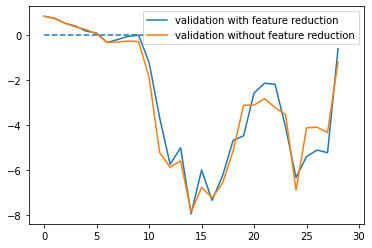

In [911]:
fig,ax = plt.subplots(1)
ax.plot(Rv_f)
ax.plot(Rv)
#ax.set_ylim(-0.5, 1)
ax.hlines(0,0,len(Rv), linestyle='dashed')
ax.legend(['validation with feature reduction','validation without feature reduction'])

The results are still not satisfactory

In [923]:
estimator = sklearn.ensemble.RandomForestRegressor()
param_grid = [
  {'ccp_alpha': [0.0,0.1],
   'criterion': ['squared_error'],
   'max_features': ["auto","sqrt","log2"], 
   'max_leaf_nodes': [None],
   'max_samples': [None],
   'min_impurity_decrease': [0.0],
   'min_samples_split': [2], #controlled by the min samples leaf instead 
   'min_samples_leaf': [1,2,4,8,16],
   'n_estimators': [1,50,100,200,500],
  }
 ]

gridsearch_p = model_selection.GridSearchCV(estimator, param_grid, n_jobs=-1, refit=False, cv=10,
                                          verbose=2, pre_dispatch='2*n_jobs', 
                                          return_train_score=False)

In [924]:
lag = 30
Xt,yt = Xy_from_df(df_tnorm,'mean_chla',lag)
Xv,yv = Xy_from_df(df_vnorm,'mean_chla',lag)

gridsearch_p.fit(Xt,yt)

Fitting 10 folds for each of 150 candidates, totalling 1500 fits


GridSearchCV(cv=10, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid=[{'ccp_alpha': [0.0, 0.1],
                          'criterion': ['squared_error'],
                          'max_features': ['auto', 'sqrt', 'log2'],
                          'max_leaf_nodes': [None], 'max_samples': [None],
                          'min_impurity_decrease': [0.0],
                          'min_samples_leaf': [1, 2, 4, 8, 16],
                          'min_samples_split': [2],
                          'n_estimators': [1, 50, 100, 200, 500]}],
             refit=False, verbose=2)

In [925]:
gridsearch_p.best_params_


{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 8,
 'min_samples_split': 2,
 'n_estimators': 1}

In [926]:
estimator = sklearn.ensemble.RandomForestRegressor(**gridsearch_p.best_params_)
Xt,yt = Xy_from_df(df_tnorm,'mean_chla',30)
Xv,yv = Xy_from_df(df_vnorm,'mean_chla',30)
estimator.fit(Xt,yt)
print(estimator.score(Xv,yv))

-0.47929117819946865


Text(0, 0.5, 'std test score')

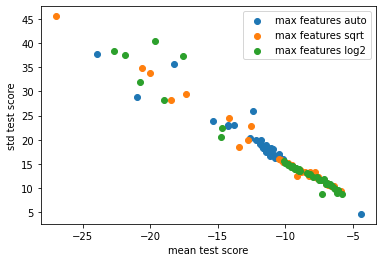

In [934]:
res = pd.DataFrame(gridsearch_p.cv_results_)
res_sorted = res.sort_values('mean_test_score')
plt.scatter(res_sorted[res_sorted['param_max_features']=='auto']['mean_test_score'],
            res_sorted[res_sorted['param_max_features']=='auto']['std_test_score'])
plt.scatter(res_sorted[res_sorted['param_max_features']=='sqrt']['mean_test_score'],
            res_sorted[res_sorted['param_max_features']=='sqrt']['std_test_score'])
plt.scatter(res_sorted[res_sorted['param_max_features']=='log2']['mean_test_score'],
            res_sorted[res_sorted['param_max_features']=='log2']['std_test_score'])
plt.legend(["max features auto","max features sqrt","max features log2"])
plt.xlabel("mean test score")
plt.ylabel("std test score")

In [928]:
res_f = res_sorted#[res_sorted['param_max_features']=='auto']

Text(0, 0.5, 'std test score')

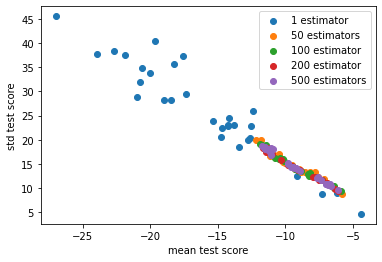

In [935]:
plt.scatter(res_f[res_f['param_n_estimators']==1]['mean_test_score'],
            res_f[res_f['param_n_estimators']==1]['std_test_score'])
plt.scatter(res_f[res_f['param_n_estimators']==50]['mean_test_score'],
            res_f[res_f['param_n_estimators']==50]['std_test_score'])
plt.scatter(res_f[res_f['param_n_estimators']==100]['mean_test_score'],
            res_f[res_f['param_n_estimators']==100]['std_test_score'])
plt.scatter(res_f[res_f['param_n_estimators']==200]['mean_test_score'],
            res_f[res_f['param_n_estimators']==200]['std_test_score'])
plt.scatter(res_f[res_f['param_n_estimators']==500]['mean_test_score'],
            res_f[res_f['param_n_estimators']==500]['std_test_score'])
plt.legend(["1 estimator","50 estimators","100 estimator","200 estimator","500 estimators"])
plt.xlabel("mean test score")
plt.ylabel("std test score")

To verify no error is made, another dataset is tried.

In [971]:
data_path = "..\\Datasets\\Forecasting_aqua\\CTD_data_EDM_nan.csv"
format = "%Y-%m-%d"
dfp = pd.read_csv(data_path)
time_dfp = pd.to_datetime(dfp["Datetime"], format=format)
try:
    dfp.drop("sample",axis=1,inplace=True)
except:
    pass
dfp['Datetime']= time_dfp

In [1004]:
#build train and val datasets
dfp_t, dfp_v = sklearn.model_selection.train_test_split(dfp, test_size=0.2, shuffle=False)
dfp_v.reset_index(inplace=True)
dfp_tnorm = pd.DataFrame()
dfp_vnorm = pd.DataFrame()
#datetime format changed into relative day since start
dfp_tnorm['Datetime'] = dfp_t['Datetime']-dfp_t['Datetime'][0]
dfp_vnorm['Datetime'] = dfp_v['Datetime']-dfp_t['Datetime'][0]
#the other keys are standardized
keys_float = dfp.keys().drop('Datetime') 
dfp_tnorm[keys_float] = (dfp_t[keys_float]-dfp_t[keys_float].mean())/dfp_t[keys_float].std()
dfp_vnorm[keys_float] = (dfp_v[keys_float]-dfp_t[keys_float].mean())/dfp_t[keys_float].std()

dfp_tnorm = dfp_tnorm.drop(['idx'],axis='columns')
dfp_vnorm = dfp_vnorm.drop(['idx'],axis='columns')

In [1036]:
Rv = []
Rt = []
R_oob = []
max_lag = 20
outkey='Chla'
for lag in range(1,max_lag):
    print(lag,end="\r")
    model = sklearn.ensemble.RandomForestRegressor(oob_score=True,n_estimators=1000)
    inkey = ['Chla','pH','Temp','Temp_cv','Cond_cv','O2ppm',
        'O2ppm_cv','pH_cv','Turb_cv','Cloud_cover_mean','Athmos_press_mean',
        'Air_temp_mean','Prec_mean','Air_humid_mean','Sun_total','Wind_speed_mean','Wind_speed_max']
    
    Xt,yt = Xy_from_df(dfp_tnorm,outkey,lag)
    Xv,yv = Xy_from_df(dfp_vnorm,outkey,lag)
    model.fit(Xt[inkey],yt)
    Rv.append(model.score(Xv[inkey],yv))
    Rt.append(model.score(Xt[inkey],yt))
    R_oob.append(model.oob_score_)
print("                        ")

In [997]:
Xt.keys()

Index(['idx', 'Temp', 'Temp_cv', 'Cond', 'Cond_cv', 'O2ppm', 'O2ppm_cv', 'pH',
       'pH_cv', 'PAR', 'Chla', 'Turb', 'Turb_cv', 'Phyco', 'Cloud_cover_mean',
       'Athmos_press_mean', 'Air_temp_mean', 'Prec_mean', 'Air_humid_mean',
       'Sun_total', 'Wind_speed_mean', 'Wind_speed_max'],
      dtype='object')

In [ ]:
#idx, PAR, Turb

In [1041]:
Xt,yt = Xy_from_df(dfp_tnorm,outkey,20)
Xv,yv = Xy_from_df(dfp_vnorm,outkey,20)
inkey = ['Chla','pH','Temp','Temp_cv','Cond_cv','O2ppm',
        'O2ppm_cv','pH_cv','Turb_cv','Cloud_cover_mean','Athmos_press_mean',
        'Air_temp_mean','Prec_mean','Air_humid_mean','Sun_total','Wind_speed_mean','Wind_speed_max']
model.fit(Xt[inkey],yt)
print(model.score(Xv[inkey],yv))

-0.37261767404133206


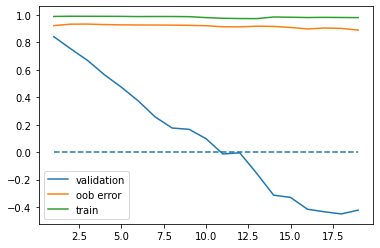

In [1040]:
fig,ax = plt.subplots(1)
ax.plot(range(1,max_lag),Rv)
ax.plot(range(1,max_lag),R_oob)
ax.plot(range(1,max_lag),Rt)
#ax.set_ylim(-0.5, 1)
ax.hlines(0,1,len(Rv), linestyle='dashed')
ax.legend(['validation','oob error','train'])

## Adaboost
To try to improve the results, the Adaboost algorithm was tried. As it focuses the results only on one dimention, it might produce better results

In [1166]:
def adaptive_lag(df_t,df_v,min_lag,summary):
    Xt = df_t.loc[:-min_lag]
    Xv = df_v.loc[:-min_lag]
    for el in summary:
        Xt.loc[:,el['key']] = np.append(np.zeros(el['lag']-min_lag),df_t[el['key']][:-el['lag']])
        Xv.loc[:,el['key']] = np.append(np.zeros(el['lag']-min_lag),df_v[el['key']][:-el['lag']])
    return Xt,Xv


def find_lag(key1,df,min_lag,max_lag):
    min_lag+=len(df)-1
    max_lag+=len(df)-1
    summary = []
    for idx,key2 in enumerate(df.keys()):
        el = {}
        el['key']=key2
        crosscor = signal.correlate(df[key1],df[key2], mode='full')
        crosscor /=df[key1].std()*df[key2].std()*len(df[key1])
        timelags = signal.correlation_lags(len(df[key1]), len(df[key2]), mode='full')
        best_cor = np.max(np.abs(crosscor[min_lag:max_lag]))
        best_lag = timelags[np.argmax(np.abs(crosscor[min_lag:max_lag]))+min_lag]
        el['cor']=best_cor
        el['lag']=best_lag
        summary.append(el)
    return summary


In [1171]:
summary

[{'key': 'asplanchna', 'cor': 0.2733831150836462, 'lag': 181},
 {'key': 'asterionella', 'cor': 0.10055983254761998, 'lag': 199},
 {'key': 'brachionus', 'cor': 0.24949567750894006, 'lag': 191},
 {'key': 'diatom_chain', 'cor': 0.19356285415256516, 'lag': 158},
 {'key': 'dinobryon', 'cor': 0.12728805141819863, 'lag': 121},
 {'key': 'eudiaptomus', 'cor': 0.24715624069934578, 'lag': 199},
 {'key': 'kellikottia', 'cor': 0.3683341201744881, 'lag': 30},
 {'key': 'keratella_quadrata', 'cor': 0.13705019472711658, 'lag': 32},
 {'key': 'nauplius', 'cor': 0.22218730605961745, 'lag': 59},
 {'key': 'polyarthra', 'cor': 0.22397442809610124, 'lag': 39},
 {'key': 'rotifers', 'cor': 0.18430367475219633, 'lag': 47},
 {'key': 'synchaeta', 'cor': 0.23910065741556016, 'lag': 44},
 {'key': 'ceratium', 'cor': 0.1787944074795342, 'lag': 98},
 {'key': 'cyclops', 'cor': 0.34907789917681314, 'lag': 151},
 {'key': 'fragilaria', 'cor': 0.13390768618412915, 'lag': 82},
 {'key': 'keratella_cochlearis', 'cor': 0.160834

In [1172]:
y_key = 'mean_chla'
model = sklearn.ensemble.AdaBoostRegressor()
lag = 1
val_split = 0.2
len_t = int(len(dfci)*(1-val_split))
df_t = dfci[:len_t]
mean_t = df_t.mean()
var_t = df_t.var()
df_t = (df_t-mean_t)/var_t
df_v = (dfci[len_t:]-mean_t)/var_t

summary = find_lag(y_key,df_t,lag,200)
Xt,Xv = adaptive_lag(df_t,df_v,lag,summary)
yt = df_t[lag:][y_key]
yv = df_v[lag:][y_key]

#initialize the dataframe

model.fit(Xt,yt)
print(model.score(Xv,yv))

0.8823710518918191


In [602]:
Rv = []
Rt = []
max_lag = 60
for lag in range(1,max_lag):
    print(lag,end="\r")
    model = sklearn.ensemble.AdaBoostRegressor()
    #model = gridsearch.best_estimator_
    yt = df_t[lag:][y_key]
    yv = df_v[lag:][y_key]
    summary = find_lag(y_key,df_t,lag,200)
    Xt,Xv =  adaptive_lag(df_t,df_v,lag,summary)
    model.fit(Xt,yt)
    Rv.append(model.score(Xv,yv))
    Rt.append(model.score(Xt,yt))
print("                        ")

C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value
C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


C:\Users\valla\Anaconda3\lib\site-packages\pandas\core\indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


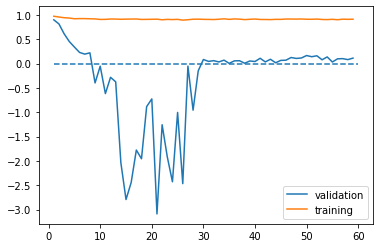

In [603]:
plt.plot(range(1,len(Rv)+1),Rv)
plt.plot(range(1,len(Rt)+1),Rt)
#plt.ylim(-3, 1)
plt.hlines(0,1,len(Rv)+1, linestyle='dashed')
plt.legend(['validation','training'])

By focussing the aim of the estimator, the results improve significantly. Note that this also happens for the random forest regressor

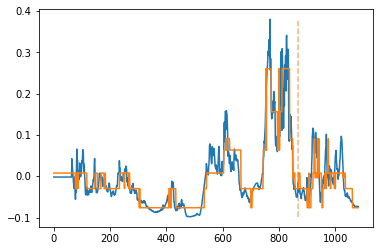

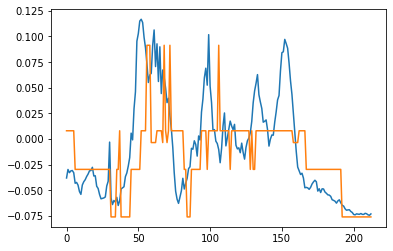

In [606]:
#define the model
model = gridsearch.best_estimator_
#define the data
key = 'mean_chla'
lag = 7
idx = Xt.keys().get_loc(key)
val_split = 0.2
len_t = int(len(dfci)*(1-val_split))
df_t = dfci[:len_t]
mean_t = df_t.mean()
var_t = df_t.var()
df_t = (df_t-mean_t)/var_t
df_v = (dfci[len_t:]-mean_t)/var_t
Xt = df_t[:-lag]
yt = df_t[lag:][ykey]
Xv = df_v[:-lag]
yv = df_v[lag:][y_key]
#fit the model
model.fit(Xt,yt)
#plot
plt.plot(range(len(yt)+len(yv)),yt.append(yv))
plt.plot(range(len(yt)+len(yv)),model.predict(Xt.append(Xv)))
plt.vlines(len(yt),np.min(yt.append(yv)),np.max(yt.append(yv)),linestyles='dashed',color='xkcd:peach')
plt.show()
plt.plot(range(len(yv)),yv)
plt.plot(range(len(yv)),model.predict(Xv))
plt.show()

In [607]:
model.score(Xv,yv)

0.30878793742960153

In [458]:
model.get_params()

{'base_estimator__ccp_alpha': 0.0,
 'base_estimator__criterion': 'squared_error',
 'base_estimator__max_depth': 1,
 'base_estimator__max_features': None,
 'base_estimator__max_leaf_nodes': None,
 'base_estimator__min_impurity_decrease': 0.0,
 'base_estimator__min_samples_leaf': 1,
 'base_estimator__min_samples_split': 2,
 'base_estimator__min_weight_fraction_leaf': 0.0,
 'base_estimator__random_state': None,
 'base_estimator__splitter': 'best',
 'base_estimator': DecisionTreeRegressor(max_depth=1),
 'learning_rate': 0.05,
 'loss': 'square',
 'n_estimators': 50,
 'random_state': None}

In [399]:
from sklearn.experimental import enable_halving_search_cv # noqa
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.tree import DecisionTreeRegressor

In [468]:
estimator = sklearn.ensemble.AdaBoostRegressor()
param_grid = [
    {'base_estimator__max_depth': [1,2,3,4,5],
     'base_estimator': [sklearn.tree.DecisionTreeRegressor()],
     'learning_rate': [0.05,0.1,0.5,1.0,2.0,3.0],
     'loss': ['linear', 'square'],
     'n_estimators': [1,10,50,100,200,300,400],
  }
 ]

gridsearch = model_selection.GridSearchCV(estimator, param_grid, 
                                                 n_jobs=-1, refit=True, cv=5,
                                                 verbose=2,return_train_score=False)

In [469]:
gridsearch.fit(Xt,yt)

Fitting 5 folds for each of 630 candidates, totalling 3150 fits


GridSearchCV(cv=5, estimator=AdaBoostRegressor(), n_jobs=-1,
             param_grid=[{'base_estimator': [DecisionTreeRegressor(max_depth=3)],
                          'base_estimator__max_depth': [1, 2, 3, 4, 5],
                          'learning_rate': [0.05, 0.1, 0.5, 1.0, 2.0, 3.0],
                          'loss': ['linear', 'square', 'exponential'],
                          'n_estimators': [1, 10, 50, 100, 200, 300, 400]}],
             scoring=make_scorer(R2), verbose=2)

In [470]:
gridsearch.best_params_

{'base_estimator': DecisionTreeRegressor(max_depth=3),
 'base_estimator__max_depth': 3,
 'learning_rate': 0.5,
 'loss': 'linear',
 'n_estimators': 1}

In [443]:
gridsearch.best_estimator_.score(Xv,yv)

-0.9156734506189836

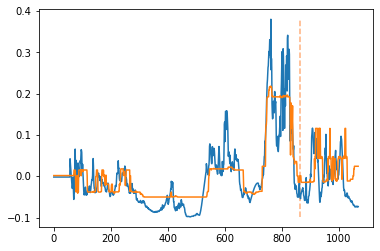

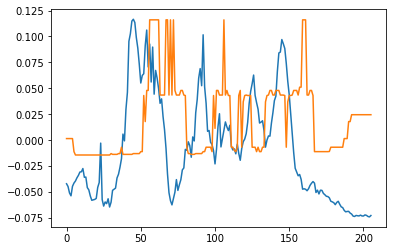

In [408]:
model = gridsearch.best_estimator_
key = 'mean_chla'
idx = Xt.keys().get_loc(key)

plt.plot(range(len(yt)+len(yv)),yt.append(yv))
plt.plot(range(len(yt)+len(yv)),model.predict(Xt.append(Xv)))
plt.vlines(len(yt),np.min(yt.append(yv)),np.max(yt.append(yv)),linestyles='dashed',color='xkcd:peach')
plt.show()
plt.plot(range(len(yv)),yv)
plt.plot(range(len(yv)),model.predict(Xv))
plt.show()

## Principal component analysis
The data can potentially be reduced to only a few relevant factors:

In [180]:
from sklearn import decomposition
PCA = decomposition.PCA()
PCA.fit(df_t)
score_t = PCA.score(df_t)
score_v = PCA.score(df_v)
print(f"The PCA score is of {score_t} for the training and of {score_v} for the validation")

The PCA score is of -175.32829031245737 for the training and of -264.7180579184038 for the validation


As one can see, the PCA is difficult as the score strongly degrade with the validation set.

In [181]:
n_component = 10
var = PCA.explained_variance_ratio_
tot_var = np.sum(var[:n_component])
print(f"The variance explained by the {n_component} first components is {tot_var}")

The variance explained by the 10 first components is 0.9892901001112371


In [182]:
PCA.transform(df_t).shape

(986, 92)

In [183]:
n_component = 75

dft_trans = PCA.transform(df_t)
dfv_trans = PCA.transform(df_v)
dft_trans[:,n_component:]=0
dfv_trans[:,n_component:]=0
dft_back = PCA.inverse_transform(dft_trans)
dfv_back = PCA.inverse_transform(dfv_trans)

err_t = np.max(np.square(df_t-dft_back))
err_v = np.max(np.square(df_v-dfv_back))
max_err = df_v.keys()[np.argmax(err_v)]
print(f"In the validation set, the maximum squarred error is {np.max(err_v)}, and"
      f" is concerning {max_err}")

In the validation set, the maximum squarred error is 0.014494916147050363, and is concerning mean_chla


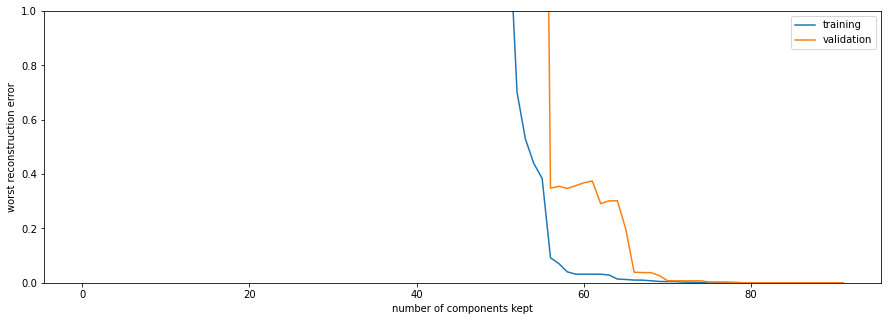

In [186]:
err_tl =[]
err_vl =[]
fig,ax = plt.subplots(1,figsize=(15,5))
for n_component in range(df_t.shape[1]):

    dft_trans = PCA.transform(df_t)
    dfv_trans = PCA.transform(df_v)
    dft_trans[:,n_component:]=0
    dfv_trans[:,n_component:]=0
    dft_back = PCA.inverse_transform(dft_trans)
    dfv_back = PCA.inverse_transform(dfv_trans)

    err_t = np.max(np.mean(np.square(df_t-dft_back)))
    err_v = np.max(np.mean(np.square(df_v-dfv_back)))
    err_tl.append(err_t)
    err_vl.append(err_v)
ax.plot(err_tl)
ax.plot(err_vl)
ax.set_ylim((0,1))
ax.legend(["training","validation"])
ax.set_ylabel("worst reconstruction error")
ax.set_xlabel("number of components kept")
plt.show()

As one can see, the data is not very colinear, so the PCA compression still needs a lot of components to keep the reconstruction error low enough. Feature selection should then be prefered